In [ ]:
# ============================================================
# 1. Import Libraries and Configure the Project
# ============================================================

import io
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageFilter
from google.colab import files


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)


# ------------------------------------------------------------
# Image Preprocessing Settings
# ------------------------------------------------------------

# Large images will be resized while preserving aspect ratio.
MAX_IMAGE_SIDE = 800

# Light smoothing helps reduce isolated noisy pixels.
APPLY_SMOOTHING = True
SMOOTHING_RADIUS = 1


# ------------------------------------------------------------
# K-Means Settings
# ------------------------------------------------------------

# Candidate K values used for selecting the number of clusters.
K_VALUES = list(range(2, 9))

# This value can be changed after examining the evaluation curves.
FINAL_K = 5

MAX_ITERATIONS = 50
TOLERANCE = 1e-4

# Number of pixels used during K-selection experiments.
ELBOW_SAMPLE_SIZE = 20000
SILHOUETTE_SAMPLE_SIZE = 3000

# Process pixels in smaller groups to control memory usage.
ASSIGNMENT_CHUNK_SIZE = 100000


# ------------------------------------------------------------
# Plot Settings
# ------------------------------------------------------------

plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["image.interpolation"] = "nearest"
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["figure.dpi"] = 110


# ------------------------------------------------------------
# Display Configuration
# ------------------------------------------------------------

print("Project environment initialized successfully.")
print("-" * 48)
print(f"Random state             : {RANDOM_STATE}")
print(f"Maximum image side       : {MAX_IMAGE_SIDE} pixels")
print(f"Candidate K values       : {K_VALUES}")
print(f"Initial final K          : {FINAL_K}")
print(f"Maximum iterations       : {MAX_ITERATIONS}")
print(f"Convergence tolerance    : {TOLERANCE}")
print(f"Image smoothing enabled  : {APPLY_SMOOTHING}")

Project environment initialized successfully.
------------------------------------------------
Random state             : 42
Maximum image side       : 800 pixels
Candidate K values       : [2, 3, 4, 5, 6, 7, 8]
Initial final K          : 5
Maximum iterations       : 50
Convergence tolerance    : 0.0001
Image smoothing enabled  : True


In [ ]:
# ============================================================
# 2. Utility Function for Displaying Multiple Images
# ============================================================

def img_grid(
    list_of_images,
    title="Image Plot",
    individual_subtitle=None,
    col_wrap=3,
    height=4
):
    """
    Display multiple grayscale or RGB images in a grid.

    Parameters
    ----------
    list_of_images : list
        List containing PIL images or NumPy image arrays.

    title : str
        Main title of the complete image grid.

    individual_subtitle : list or None
        Subtitle for each individual image.

    col_wrap : int
        Maximum number of images displayed in each row.

    height : int or float
        Height of each subplot.
    """

    total_images = len(list_of_images)

    if total_images == 0:
        print("No image was provided.")
        return

    if individual_subtitle is None:
        individual_subtitle = []

    columns = min(col_wrap, total_images)
    rows = int(np.ceil(total_images / columns))

    fig, axes = plt.subplots(
        rows,
        columns,
        figsize=(5 * columns, height * rows),
        squeeze=False
    )

    axes = axes.flatten()

    for index, image in enumerate(list_of_images):

        image_array = np.asarray(image)

        if image_array.ndim == 2:
            axes[index].imshow(image_array, cmap="gray")
        else:
            axes[index].imshow(image_array)

        if index < len(individual_subtitle):
            axes[index].set_title(individual_subtitle[index])

        axes[index].axis("off")

    # Hide empty subplot areas.
    for index in range(total_images, len(axes)):
        axes[index].axis("off")

    fig.suptitle(title, fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()


print("Image display utility function created successfully.")

Image display utility function created successfully.


Saving primary image.jpg to primary image.jpg
Primary image uploaded successfully.
------------------------------------------------
Filename          : primary image.jpg
Image format      : JPEG
Color mode        : RGB
Image resolution  : 4928 × 3264
NumPy shape       : (3264, 4928, 3)
Data type         : uint8
File size         : 3.08 MB


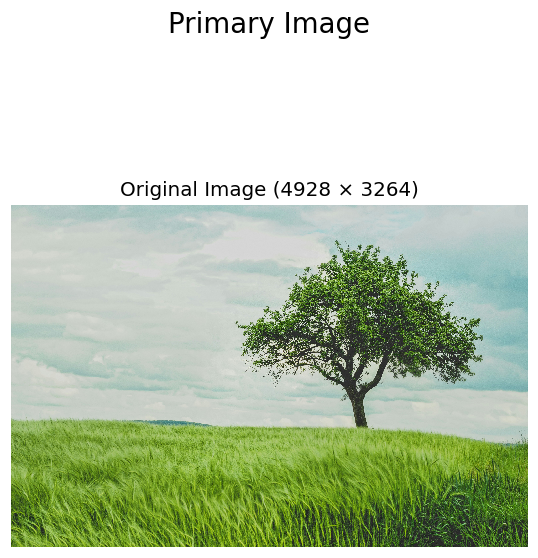

In [ ]:
# ============================================================
# 3. Upload and Validate the Primary Image
# ============================================================

uploaded_files = files.upload()

if len(uploaded_files) == 0:
    raise ValueError("No image was uploaded.")

if len(uploaded_files) > 1:
    raise ValueError(
        "Please upload exactly one primary image at this stage."
    )


# Get the uploaded filename and binary data.
primary_image_name = list(uploaded_files.keys())[0]
primary_image_bytes = uploaded_files[primary_image_name]


# Read and validate the uploaded image.
try:
    with Image.open(io.BytesIO(primary_image_bytes)) as uploaded_image:
        original_image_format = uploaded_image.format
        primary_image = uploaded_image.convert("RGB").copy()

except Exception as error:
    raise ValueError(
        "The uploaded file is not a valid image."
    ) from error


# Convert the PIL image into a NumPy array.
primary_image_np = np.asarray(primary_image, dtype=np.uint8)

original_width, original_height = primary_image.size
file_size_mb = len(primary_image_bytes) / (1024 ** 2)


# Display image information.
print("Primary image uploaded successfully.")
print("-" * 48)
print(f"Filename          : {primary_image_name}")
print(f"Image format      : {original_image_format}")
print(f"Color mode        : {primary_image.mode}")
print(f"Image resolution  : {original_width} × {original_height}")
print(f"NumPy shape       : {primary_image_np.shape}")
print(f"Data type         : {primary_image_np.dtype}")
print(f"File size         : {file_size_mb:.2f} MB")


# Display the uploaded image.
img_grid(
    [primary_image],
    title="Primary Image",
    individual_subtitle=[
        f"Original Image ({original_width} × {original_height})"
    ],
    col_wrap=1,
    height=6
)

Image preprocessing completed successfully.
----------------------------------------------------
Original resolution       : 4928 × 3264
Processing resolution     : 800 × 530
Number of color channels  : 3
Resize scale              : 0.1623
Original pixel count      : 16,084,992
Processing pixel count    : 424,000
Pixel count reduction     : 97.36%
Gaussian smoothing        : Applied


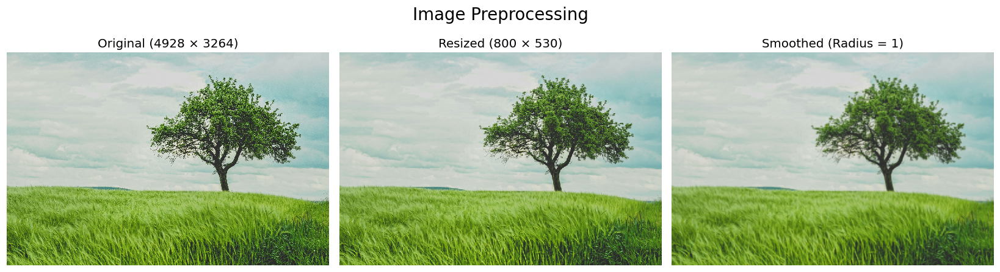

In [ ]:
# ============================================================
# 4. Resize and Preprocess the Primary Image
# ============================================================

def resize_with_aspect_ratio(image, maximum_side=800):
    """
    Resize a PIL image while preserving its original aspect ratio.

    The image is resized only when its largest side is greater
    than the specified maximum side.
    """

    original_width, original_height = image.size
    largest_side = max(original_width, original_height)

    # Avoid enlarging a small image.
    if largest_side <= maximum_side:
        return image.copy(), 1.0

    resize_scale = maximum_side / largest_side

    resized_width = int(round(original_width * resize_scale))
    resized_height = int(round(original_height * resize_scale))

    resized_image = image.resize(
        (resized_width, resized_height),
        Image.Resampling.LANCZOS
    )

    return resized_image, resize_scale


# Resize the primary image.
resized_image, resize_scale = resize_with_aspect_ratio(
    primary_image,
    maximum_side=MAX_IMAGE_SIDE
)


# Apply optional light Gaussian smoothing.
if APPLY_SMOOTHING:
    processed_image = resized_image.filter(
        ImageFilter.GaussianBlur(radius=SMOOTHING_RADIUS)
    )
else:
    processed_image = resized_image.copy()


# Convert the processed image into a NumPy array.
processed_image_np = np.asarray(
    processed_image,
    dtype=np.uint8
)

processed_height, processed_width, processed_channels = (
    processed_image_np.shape
)

original_pixel_count = original_width * original_height
processed_pixel_count = processed_width * processed_height

pixel_reduction_percentage = (
    1 - (processed_pixel_count / original_pixel_count)
) * 100


# Display preprocessing information.
print("Image preprocessing completed successfully.")
print("-" * 52)
print(
    f"Original resolution       : "
    f"{original_width} × {original_height}"
)
print(
    f"Processing resolution     : "
    f"{processed_width} × {processed_height}"
)
print(
    f"Number of color channels  : "
    f"{processed_channels}"
)
print(
    f"Resize scale              : "
    f"{resize_scale:.4f}"
)
print(
    f"Original pixel count      : "
    f"{original_pixel_count:,}"
)
print(
    f"Processing pixel count    : "
    f"{processed_pixel_count:,}"
)
print(
    f"Pixel count reduction     : "
    f"{pixel_reduction_percentage:.2f}%"
)
print(
    f"Gaussian smoothing        : "
    f"{'Applied' if APPLY_SMOOTHING else 'Not applied'}"
)


# Compare the preprocessing stages.
img_grid(
    [primary_image, resized_image, processed_image],
    title="Image Preprocessing",
    individual_subtitle=[
        f"Original ({original_width} × {original_height})",
        f"Resized ({processed_width} × {processed_height})",
        (
            f"Smoothed (Radius = {SMOOTHING_RADIUS})"
            if APPLY_SMOOTHING
            else "Processed Image"
        )
    ],
    col_wrap=3,
    height=4
)

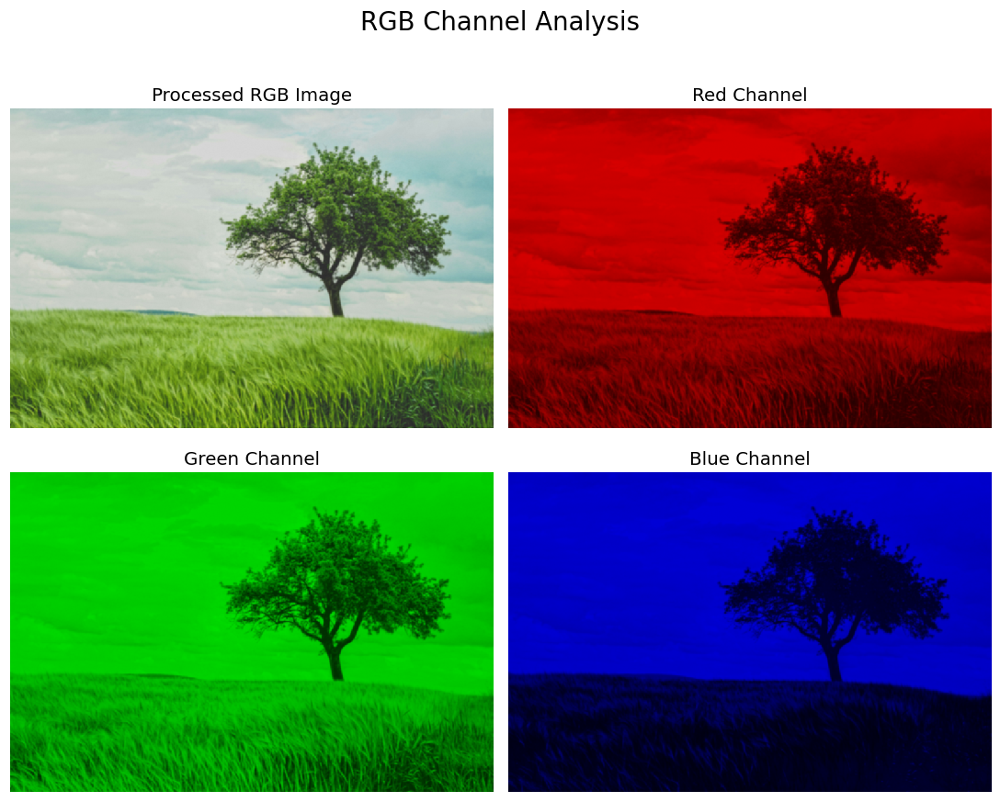

RGB Channel Statistics


,Channel,Minimum,Maximum,Mean,Standard Deviation
0,Red,38,220,148.69,51.34
1,Green,42,222,171.31,43.94
2,Blue,14,217,129.47,75.54


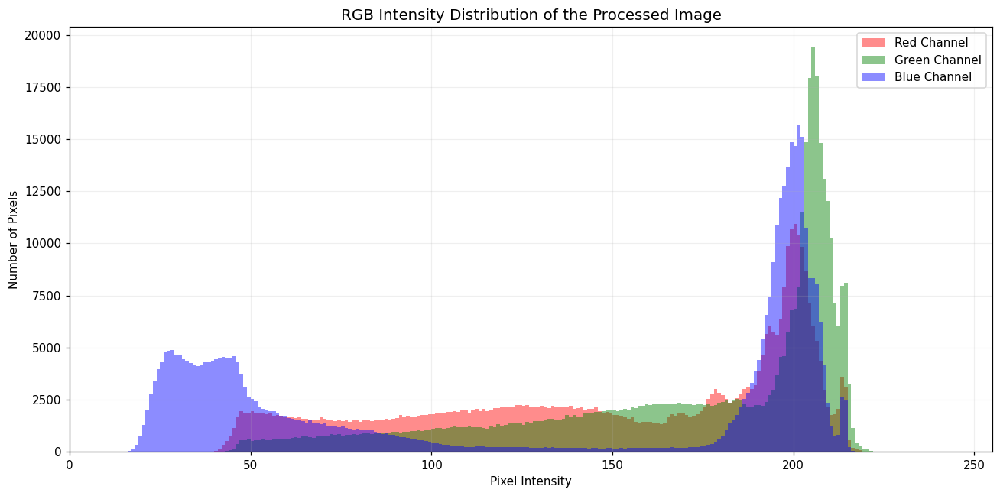

In [ ]:
# ============================================================
# 5. RGB Channel and Color Histogram Analysis
# ============================================================

# Separate the RGB channels.
red_channel = processed_image_np[:, :, 0]
green_channel = processed_image_np[:, :, 1]
blue_channel = processed_image_np[:, :, 2]


# Create colorized representations of individual channels.
red_visualization = np.zeros_like(processed_image_np)
green_visualization = np.zeros_like(processed_image_np)
blue_visualization = np.zeros_like(processed_image_np)

red_visualization[:, :, 0] = red_channel
green_visualization[:, :, 1] = green_channel
blue_visualization[:, :, 2] = blue_channel


# Display the processed image and its RGB channels.
img_grid(
    [
        processed_image_np,
        red_visualization,
        green_visualization,
        blue_visualization
    ],
    title="RGB Channel Analysis",
    individual_subtitle=[
        "Processed RGB Image",
        "Red Channel",
        "Green Channel",
        "Blue Channel"
    ],
    col_wrap=2,
    height=4
)


# Calculate descriptive statistics for each channel.
channel_statistics = pd.DataFrame(
    {
        "Channel": ["Red", "Green", "Blue"],
        "Minimum": [
            red_channel.min(),
            green_channel.min(),
            blue_channel.min()
        ],
        "Maximum": [
            red_channel.max(),
            green_channel.max(),
            blue_channel.max()
        ],
        "Mean": [
            red_channel.mean(),
            green_channel.mean(),
            blue_channel.mean()
        ],
        "Standard Deviation": [
            red_channel.std(),
            green_channel.std(),
            blue_channel.std()
        ]
    }
)

channel_statistics[["Mean", "Standard Deviation"]] = (
    channel_statistics[
        ["Mean", "Standard Deviation"]
    ].round(2)
)

print("RGB Channel Statistics")
display(channel_statistics)


# Plot the RGB intensity histograms.
plt.figure(figsize=(12, 6))

channel_information = [
    (red_channel, "red", "Red"),
    (green_channel, "green", "Green"),
    (blue_channel, "blue", "Blue")
]

for channel, color, label in channel_information:
    plt.hist(
        channel.ravel(),
        bins=256,
        range=(0, 256),
        color=color,
        alpha=0.45,
        label=f"{label} Channel"
    )

plt.title("RGB Intensity Distribution of the Processed Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.xlim(0, 255)
plt.grid(alpha=0.2)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 6. Convert Image Pixels into a Feature Matrix
# ============================================================


pixel_features = processed_image_np.reshape(-1, 3).astype(
    np.float32
)

# Normalize RGB values from [0, 255] to [0, 1].
pixel_features = pixel_features / 255.0


# Validate the feature matrix.
number_of_pixels = processed_height * processed_width
expected_feature_shape = (number_of_pixels, 3)

if pixel_features.shape != expected_feature_shape:
    raise ValueError(
        "The feature matrix does not match the image dimensions."
    )

if not np.isfinite(pixel_features).all():
    raise ValueError(
        "The feature matrix contains invalid values."
    )


# Create a reproducible pixel sample for K-selection experiments.
sample_size = min(
    ELBOW_SAMPLE_SIZE,
    number_of_pixels
)

sampling_generator = np.random.default_rng(
    RANDOM_STATE
)

sample_indices = sampling_generator.choice(
    number_of_pixels,
    size=sample_size,
    replace=False
)

k_selection_features = pixel_features[sample_indices]


# Calculate feature-matrix memory usage.
feature_memory_mb = pixel_features.nbytes / (1024 ** 2)


# Display feature information.
print("Pixel feature matrix created successfully.")
print("-" * 52)
print(f"Processed image shape      : {processed_image_np.shape}")
print(f"Total number of pixels     : {number_of_pixels:,}")
print(f"Feature matrix shape       : {pixel_features.shape}")
print(f"K-selection sample shape   : {k_selection_features.shape}")
print(f"Minimum normalized value   : {pixel_features.min():.4f}")
print(f"Maximum normalized value   : {pixel_features.max():.4f}")
print(f"Feature data type          : {pixel_features.dtype}")
print(f"Feature matrix memory      : {feature_memory_mb:.2f} MB")


# Show a small preview of the RGB feature vectors.
feature_preview = pd.DataFrame(
    pixel_features[:10],
    columns=[
        "Red (Normalized)",
        "Green (Normalized)",
        "Blue (Normalized)"
    ]
)

print("\nFirst 10 pixel feature vectors:")
display(feature_preview.round(4))

Pixel feature matrix created successfully.
----------------------------------------------------
Processed image shape      : (530, 800, 3)
Total number of pixels     : 424,000
Feature matrix shape       : (424000, 3)
K-selection sample shape   : (20000, 3)
Minimum normalized value   : 0.0549
Maximum normalized value   : 0.8706
Feature data type          : float32
Feature matrix memory      : 4.85 MB

First 10 pixel feature vectors:


,Red (Normalized),Green (Normalized),Blue (Normalized)
0,0.6784,0.7647,0.7529
1,0.6784,0.7647,0.7529
2,0.6863,0.7686,0.7569
3,0.6863,0.7725,0.7569
4,0.6824,0.7725,0.7490
5,0.6824,0.7686,0.7490
6,0.6824,0.7686,0.7451
7,0.6745,0.7725,0.7373
8,0.6745,0.7725,0.7373
9,0.6824,0.7725,0.7490


In [ ]:
# ============================================================
# 7. Manual K-Means++ Centroid Initialization
# ============================================================

def initialize_centroids_kmeans_pp(
    features,
    number_of_clusters,
    random_state=42
):
    """
    Initialize cluster centroids using the K-Means++ method.

    The first centroid is selected randomly. Each subsequent
    centroid is selected with a probability proportional to its
    squared distance from the nearest existing centroid.

    Parameters
    ----------
    features : numpy.ndarray
        Feature matrix with shape (number_of_samples, features).

    number_of_clusters : int
        Required number of centroids.

    random_state : int
        Seed used for reproducible initialization.

    Returns
    -------
    centroids : numpy.ndarray
        Initialized centroids with shape
        (number_of_clusters, number_of_features).
    """

    features = np.asarray(features, dtype=np.float32)

    if features.ndim != 2:
        raise ValueError(
            "The feature matrix must be a two-dimensional array."
        )

    number_of_samples, number_of_features = features.shape

    if number_of_clusters < 2:
        raise ValueError(
            "The number of clusters must be at least 2."
        )

    if number_of_clusters > number_of_samples:
        raise ValueError(
            "The number of clusters cannot exceed the number "
            "of feature vectors."
        )

    random_generator = np.random.default_rng(random_state)

    centroids = np.empty(
        (number_of_clusters, number_of_features),
        dtype=np.float32
    )

    # Select the first centroid randomly.
    first_centroid_index = random_generator.integers(
        0,
        number_of_samples
    )

    centroids[0] = features[first_centroid_index]

    closest_squared_distances = np.sum(
        (features - centroids[0]) ** 2,
        axis=1
    )

    for centroid_index in range(1, number_of_clusters):

        total_squared_distance = np.sum(
            closest_squared_distances,
            dtype=np.float64
        )

        if total_squared_distance <= np.finfo(np.float32).eps:
            selected_index = random_generator.integers(
                0,
                number_of_samples
            )

        else:
            selection_probabilities = (
                closest_squared_distances
                / total_squared_distance
            )

            selection_probabilities = (
                selection_probabilities
                / selection_probabilities.sum()
            )

            selected_index = random_generator.choice(
                number_of_samples,
                p=selection_probabilities
            )

        centroids[centroid_index] = features[selected_index]

        new_squared_distances = np.sum(
            (features - centroids[centroid_index]) ** 2,
            axis=1
        )

        closest_squared_distances = np.minimum(
            closest_squared_distances,
            new_squared_distances
        )

    return centroids

test_initial_centroids = initialize_centroids_kmeans_pp(
    k_selection_features,
    number_of_clusters=FINAL_K,
    random_state=RANDOM_STATE
)

initial_centroid_table = pd.DataFrame(
    test_initial_centroids,
    columns=[
        "Red (Normalized)",
        "Green (Normalized)",
        "Blue (Normalized)"
    ],
    index=[
        f"Centroid {index + 1}"
        for index in range(FINAL_K)
    ]
)

print("K-Means++ initialization completed successfully.")
print("-" * 56)
print(f"Number of initial centroids : {FINAL_K}")
print(f"Centroid matrix shape       : {test_initial_centroids.shape}")
print("\nInitial centroid values:")
display(initial_centroid_table.round(4))

K-Means++ initialization completed successfully.
--------------------------------------------------------
Number of initial centroids : 5
Centroid matrix shape       : (5, 3)

Initial centroid values:


,Red (Normalized),Green (Normalized),Blue (Normalized)
Centroid 1,0.6392,0.6784,0.6314
Centroid 2,0.7608,0.8000,0.7647
Centroid 3,0.3098,0.4588,0.2078
Centroid 4,0.6078,0.7647,0.7608
Centroid 5,0.3216,0.4510,0.0863


In [ ]:
# ============================================================
# 8. Assign Pixels to Their Nearest Centroid
# ============================================================

def assign_pixels_to_centroids(
    features,
    centroids,
    chunk_size=100000
):
    """
    Assign each feature vector to its nearest centroid using
    squared Euclidean distance.

    Chunk-wise processing is used to avoid creating an excessively
    large distance matrix when processing a high-resolution image.

    Parameters
    ----------
    features : numpy.ndarray
        Feature matrix with shape (number_of_pixels, features).

    centroids : numpy.ndarray
        Centroid matrix with shape (number_of_clusters, features).

    chunk_size : int
        Maximum number of feature vectors processed at once.

    Returns
    -------
    cluster_labels : numpy.ndarray
        Nearest cluster index assigned to each feature vector.

    minimum_squared_distances : numpy.ndarray
        Squared distance of each feature vector from its assigned
        centroid.
    """

    features = np.asarray(features, dtype=np.float32)
    centroids = np.asarray(centroids, dtype=np.float32)

    if features.ndim != 2 or centroids.ndim != 2:
        raise ValueError(
            "Features and centroids must both be 2D arrays."
        )

    if features.shape[1] != centroids.shape[1]:
        raise ValueError(
            "Features and centroids must have the same "
            "number of columns."
        )

    if chunk_size <= 0:
        raise ValueError(
            "Chunk size must be a positive integer."
        )

    number_of_samples = features.shape[0]

    cluster_labels = np.empty(
        number_of_samples,
        dtype=np.int32
    )

    minimum_squared_distances = np.empty(
        number_of_samples,
        dtype=np.float32
    )

    # Process the feature matrix in memory-safe chunks.
    for start_index in range(0, number_of_samples, chunk_size):

        end_index = min(
            start_index + chunk_size,
            number_of_samples
        )

        feature_chunk = features[start_index:end_index]

        # Shape:
        # (chunk pixels, number of clusters, RGB features)
        differences = (
            feature_chunk[:, np.newaxis, :]
            - centroids[np.newaxis, :, :]
        )

        squared_distances = np.sum(
            differences ** 2,
            axis=2
        )

        chunk_labels = np.argmin(
            squared_distances,
            axis=1
        )

        cluster_labels[start_index:end_index] = chunk_labels

        minimum_squared_distances[start_index:end_index] = (
            squared_distances[
                np.arange(len(feature_chunk)),
                chunk_labels
            ]
        )

    return cluster_labels, minimum_squared_distances


# ------------------------------------------------------------
# Test the assignment function using the K-selection sample
# ------------------------------------------------------------

test_cluster_labels, test_squared_distances = (
    assign_pixels_to_centroids(
        k_selection_features,
        test_initial_centroids,
        chunk_size=ASSIGNMENT_CHUNK_SIZE
    )
)

test_cluster_counts = np.bincount(
    test_cluster_labels,
    minlength=FINAL_K
)

test_cluster_percentages = (
    test_cluster_counts
    / len(test_cluster_labels)
) * 100

initial_assignment_inertia = np.sum(
    test_squared_distances,
    dtype=np.float64
)

assignment_test_table = pd.DataFrame(
    {
        "Cluster": [
            f"Cluster {index + 1}"
            for index in range(FINAL_K)
        ],
        "Assigned Pixels": test_cluster_counts,
        "Percentage (%)": test_cluster_percentages
    }
)

assignment_test_table["Percentage (%)"] = (
    assignment_test_table["Percentage (%)"].round(2)
)


print("Pixel-to-centroid assignment completed successfully.")
print("-" * 58)
print(f"Number of assigned pixels : {len(test_cluster_labels):,}")
print(f"Cluster label range       : "
      f"{test_cluster_labels.min()} to "
      f"{test_cluster_labels.max()}")
print(f"Initial assignment inertia: "
      f"{initial_assignment_inertia:.4f}")

print("\nInitial cluster distribution:")
display(assignment_test_table)

Pixel-to-centroid assignment completed successfully.
----------------------------------------------------------
Number of assigned pixels : 20,000
Cluster label range       : 0 to 4
Initial assignment inertia: 445.9966

Initial cluster distribution:


,Cluster,Assigned Pixels,Percentage (%)
0,Cluster 1,1444,7.22
1,Cluster 2,8791,43.96
2,Cluster 3,4652,23.26
3,Cluster 4,1719,8.60
4,Cluster 5,3394,16.97


In [ ]:
# ============================================================
# 9. Update Centroids and Handle Empty Clusters
# ============================================================

def update_cluster_centroids(
    features,
    cluster_labels,
    number_of_clusters,
    point_squared_distances=None,
    random_state=42
):
    """
    Update every centroid using the mean feature vector of the
    pixels assigned to that cluster.

    If a cluster becomes empty, its centroid is reinitialized
    using a pixel that is far away from its currently assigned
    centroid.

    Parameters
    ----------
    features : numpy.ndarray
        Feature matrix with shape (number_of_pixels, features).

    cluster_labels : numpy.ndarray
        Cluster index assigned to each feature vector.

    number_of_clusters : int
        Total number of clusters.

    point_squared_distances : numpy.ndarray or None
        Squared distance of every feature vector from its
        currently assigned centroid.

    random_state : int
        Seed used for reproducible empty-cluster handling.

    Returns
    -------
    updated_centroids : numpy.ndarray
        Newly calculated centroid values.

    cluster_counts : numpy.ndarray
        Number of feature vectors assigned to each cluster.

    empty_clusters : list
        Indices of clusters that were empty before reinitialization.
    """

    features = np.asarray(features, dtype=np.float32)
    cluster_labels = np.asarray(
        cluster_labels,
        dtype=np.int32
    )

    if features.ndim != 2:
        raise ValueError(
            "The feature matrix must be two-dimensional."
        )

    if len(features) != len(cluster_labels):
        raise ValueError(
            "The number of features and labels must be equal."
        )

    if cluster_labels.min() < 0:
        raise ValueError(
            "Cluster labels cannot be negative."
        )

    if cluster_labels.max() >= number_of_clusters:
        raise ValueError(
            "A cluster label exceeds the number of clusters."
        )

    number_of_features = features.shape[1]

    updated_centroids = np.empty(
        (number_of_clusters, number_of_features),
        dtype=np.float32
    )

    cluster_counts = np.bincount(
        cluster_labels,
        minlength=number_of_clusters
    )

    empty_clusters = []

    # Calculate the mean feature vector for non-empty clusters.
    for cluster_index in range(number_of_clusters):

        cluster_mask = (
            cluster_labels == cluster_index
        )

        if cluster_counts[cluster_index] > 0:
            updated_centroids[cluster_index] = np.mean(
                features[cluster_mask],
                axis=0,
                dtype=np.float64
            )

        else:
            empty_clusters.append(cluster_index)

    # Reinitialize any empty clusters.
    if empty_clusters:

        random_generator = np.random.default_rng(
            random_state
        )

        if point_squared_distances is not None:

            point_squared_distances = np.asarray(
                point_squared_distances
            )

            if len(point_squared_distances) != len(features):
                raise ValueError(
                    "The distance array must match the number "
                    "of feature vectors."
                )

            # Pixels with the largest errors are the best
            # candidates for empty-cluster reinitialization.
            candidate_indices = np.argsort(
                point_squared_distances
            )[::-1]

            used_candidate_indices = set()

            for cluster_index in empty_clusters:

                for candidate_index in candidate_indices:

                    candidate_index = int(candidate_index)

                    if candidate_index not in used_candidate_indices:
                        updated_centroids[cluster_index] = (
                            features[candidate_index]
                        )

                        used_candidate_indices.add(
                            candidate_index
                        )
                        break

        else:
            # Fallback when point distances are unavailable.
            for cluster_index in empty_clusters:
                random_index = random_generator.integers(
                    0,
                    len(features)
                )

                updated_centroids[cluster_index] = (
                    features[random_index]
                )

    return (
        updated_centroids,
        cluster_counts,
        empty_clusters
    )


# ------------------------------------------------------------
# Test one centroid-update step
# ------------------------------------------------------------

(
    test_updated_centroids,
    test_updated_cluster_counts,
    test_empty_clusters
) = update_cluster_centroids(
    k_selection_features,
    test_cluster_labels,
    number_of_clusters=FINAL_K,
    point_squared_distances=test_squared_distances,
    random_state=RANDOM_STATE
)


# Calculate the movement of each centroid.
test_centroid_movements = np.linalg.norm(
    test_updated_centroids - test_initial_centroids,
    axis=1
)


centroid_update_table = pd.DataFrame(
    {
        "Cluster": [
            f"Cluster {index + 1}"
            for index in range(FINAL_K)
        ],
        "Old Red": test_initial_centroids[:, 0],
        "Old Green": test_initial_centroids[:, 1],
        "Old Blue": test_initial_centroids[:, 2],
        "New Red": test_updated_centroids[:, 0],
        "New Green": test_updated_centroids[:, 1],
        "New Blue": test_updated_centroids[:, 2],
        "Movement": test_centroid_movements,
        "Pixel Count": test_updated_cluster_counts
    }
)


print("Centroid update completed successfully.")
print("-" * 52)
print(
    f"Maximum centroid movement : "
    f"{test_centroid_movements.max():.6f}"
)

if test_empty_clusters:
    print(
        "Reinitialized empty clusters: "
        f"{[index + 1 for index in test_empty_clusters]}"
    )
else:
    print("Empty clusters            : None")

print("\nCentroid update details:")
display(centroid_update_table.round(4))

Centroid update completed successfully.
----------------------------------------------------
Maximum centroid movement : 0.212059
Empty clusters            : None

Centroid update details:


,Cluster,Old Red,Old Green,Old Blue,New Red,New Green,New Blue,Movement,Pixel Count
0,Cluster 1,0.6392,0.6784,0.6314,0.5844,0.6925,0.4270,0.2121,1444
1,Cluster 2,0.7608,0.8000,0.7647,0.7715,0.8096,0.7836,0.0237,8791
2,Cluster 3,0.3098,0.4588,0.2078,0.3787,0.4935,0.2141,0.0774,4652
3,Cluster 4,0.6078,0.7647,0.7608,0.6257,0.7610,0.7454,0.0239,1719
4,Cluster 5,0.3216,0.4510,0.0863,0.3480,0.4974,0.1147,0.0605,3394


In [ ]:
# ============================================================
# 10. Complete Iterative K-Means Algorithm from Scratch
# ============================================================

def kmeans_from_scratch(
    features,
    number_of_clusters,
    max_iterations=50,
    tolerance=1e-4,
    chunk_size=100000,
    random_state=42,
    verbose=False
):
    """
    Perform K-Means clustering using the manually implemented
    K-Means++ initialization, assignment, and update functions.

    Parameters
    ----------
    features : numpy.ndarray
        Input feature matrix.

    number_of_clusters : int
        Number of clusters, K.

    max_iterations : int
        Maximum number of K-Means iterations.

    tolerance : float
        Convergence threshold for maximum centroid movement.

    chunk_size : int
        Number of feature vectors processed in each chunk.

    random_state : int
        Seed used for reproducibility.

    verbose : bool
        Print iteration-level information when True.

    Returns
    -------
    result : dict
        Dictionary containing centroids, labels, distances,
        convergence history, runtime, and other information.
    """

    features = np.asarray(features, dtype=np.float32)

    if features.ndim != 2:
        raise ValueError(
            "The input features must be a two-dimensional array."
        )

    if number_of_clusters < 2:
        raise ValueError(
            "The number of clusters must be at least 2."
        )

    if number_of_clusters > len(features):
        raise ValueError(
            "The number of clusters cannot exceed the number "
            "of feature vectors."
        )

    if max_iterations <= 0:
        raise ValueError(
            "Maximum iterations must be a positive integer."
        )

    if tolerance < 0:
        raise ValueError(
            "Tolerance cannot be negative."
        )

    start_time = time.perf_counter()

    # Step 1: Initialize centroids using K-Means++.
    centroids = initialize_centroids_kmeans_pp(
        features,
        number_of_clusters=number_of_clusters,
        random_state=random_state
    )

    inertia_history = []
    centroid_shift_history = []
    empty_cluster_history = []

    converged = False
    iterations_completed = 0

    # Step 2: Repeat assignment and update operations.
    for iteration in range(1, max_iterations + 1):

        cluster_labels, point_squared_distances = (
            assign_pixels_to_centroids(
                features,
                centroids,
                chunk_size=chunk_size
            )
        )

        current_inertia = np.sum(
            point_squared_distances,
            dtype=np.float64
        )

        (
            updated_centroids,
            cluster_counts,
            empty_clusters
        ) = update_cluster_centroids(
            features,
            cluster_labels,
            number_of_clusters=number_of_clusters,
            point_squared_distances=point_squared_distances,
            random_state=random_state + iteration
        )

        centroid_movements = np.linalg.norm(
            updated_centroids - centroids,
            axis=1
        )

        maximum_centroid_movement = float(
            centroid_movements.max()
        )

        inertia_history.append(current_inertia)
        centroid_shift_history.append(
            maximum_centroid_movement
        )
        empty_cluster_history.append(
            [index + 1 for index in empty_clusters]
        )

        centroids = updated_centroids
        iterations_completed = iteration

        if verbose:
            print(
                f"Iteration {iteration:02d} | "
                f"Inertia: {current_inertia:.6f} | "
                f"Maximum centroid shift: "
                f"{maximum_centroid_movement:.6f}"
            )

        # Step 3: Check the convergence condition.
        if maximum_centroid_movement <= tolerance:
            converged = True
            break

    # Perform a final assignment using the final centroids.
    final_labels, final_squared_distances = (
        assign_pixels_to_centroids(
            features,
            centroids,
            chunk_size=chunk_size
        )
    )

    final_inertia = np.sum(
        final_squared_distances,
        dtype=np.float64
    )

    final_cluster_counts = np.bincount(
        final_labels,
        minlength=number_of_clusters
    )

    # Store the objective value corresponding to final centroids.
    if inertia_history:
        inertia_history[-1] = final_inertia

    runtime_seconds = time.perf_counter() - start_time

    result = {
        "centroids": centroids,
        "labels": final_labels,
        "squared_distances": final_squared_distances,
        "inertia": final_inertia,
        "inertia_history": np.asarray(
            inertia_history,
            dtype=np.float64
        ),
        "centroid_shift_history": np.asarray(
            centroid_shift_history,
            dtype=np.float64
        ),
        "cluster_counts": final_cluster_counts,
        "empty_cluster_history": empty_cluster_history,
        "iterations": iterations_completed,
        "converged": converged,
        "runtime_seconds": runtime_seconds,
        "number_of_clusters": number_of_clusters
    }

    return result


# ------------------------------------------------------------
# Test the complete algorithm on the 20,000-pixel sample
# ------------------------------------------------------------

test_kmeans_result = kmeans_from_scratch(
    k_selection_features,
    number_of_clusters=FINAL_K,
    max_iterations=MAX_ITERATIONS,
    tolerance=TOLERANCE,
    chunk_size=ASSIGNMENT_CHUNK_SIZE,
    random_state=RANDOM_STATE,
    verbose=True
)


# Prepare a summary of the final sample clusters.
test_final_centroids = test_kmeans_result["centroids"]
test_final_counts = test_kmeans_result["cluster_counts"]

test_final_percentages = (
    test_final_counts
    / len(k_selection_features)
) * 100

test_result_table = pd.DataFrame(
    {
        "Cluster": [
            f"Cluster {index + 1}"
            for index in range(FINAL_K)
        ],
        "Red": test_final_centroids[:, 0],
        "Green": test_final_centroids[:, 1],
        "Blue": test_final_centroids[:, 2],
        "Pixel Count": test_final_counts,
        "Percentage (%)": test_final_percentages
    }
)

print("\nSample K-Means execution completed.")
print("-" * 52)
print(
    f"Converged             : "
    f"{test_kmeans_result['converged']}"
)
print(
    f"Iterations completed  : "
    f"{test_kmeans_result['iterations']}"
)
print(
    f"Final inertia         : "
    f"{test_kmeans_result['inertia']:.6f}"
)
print(
    f"Inertia per pixel     : "
    f"{test_kmeans_result['inertia'] / len(k_selection_features):.8f}"
)
print(
    f"Execution time        : "
    f"{test_kmeans_result['runtime_seconds']:.4f} seconds"
)

print("\nFinal sample-cluster information:")
display(test_result_table.round(4))

Iteration 01 | Inertia: 445.996571 | Maximum centroid shift: 0.212059
Iteration 02 | Inertia: 293.796902 | Maximum centroid shift: 0.094907
Iteration 03 | Inertia: 182.935992 | Maximum centroid shift: 0.074791
Iteration 04 | Inertia: 139.928033 | Maximum centroid shift: 0.024234
Iteration 05 | Inertia: 134.719646 | Maximum centroid shift: 0.011472
Iteration 06 | Inertia: 133.305933 | Maximum centroid shift: 0.008025
Iteration 07 | Inertia: 132.618081 | Maximum centroid shift: 0.006086
Iteration 08 | Inertia: 132.207576 | Maximum centroid shift: 0.004290
Iteration 09 | Inertia: 132.010797 | Maximum centroid shift: 0.002590
Iteration 10 | Inertia: 131.943095 | Maximum centroid shift: 0.001670
Iteration 11 | Inertia: 131.913606 | Maximum centroid shift: 0.001338
Iteration 12 | Inertia: 131.891955 | Maximum centroid shift: 0.001109
Iteration 13 | Inertia: 131.878938 | Maximum centroid shift: 0.000974
Iteration 14 | Inertia: 131.867036 | Maximum centroid shift: 0.000864
Iteration 15 | Inert

,Cluster,Red,Green,Blue,Pixel Count,Percentage (%)
0,Cluster 1,0.5334,0.6676,0.2996,2778,13.89
1,Cluster 2,0.7784,0.8123,0.7868,8008,40.04
2,Cluster 3,0.4000,0.5545,0.1414,3526,17.63
3,Cluster 4,0.6473,0.7595,0.7312,2830,14.15
4,Cluster 5,0.2403,0.3307,0.1647,2858,14.29


K-Means convergence verification
------------------------------------------------
Number of iterations       : 20
Initial inertia            : 445.996571
Final inertia              : 131.845622
Inertia reduction          : 70.44%
Inertia non-increasing     : True
Final centroid shift       : 0.00005014
Convergence tolerance      : 0.00010000
Convergence condition met  : True


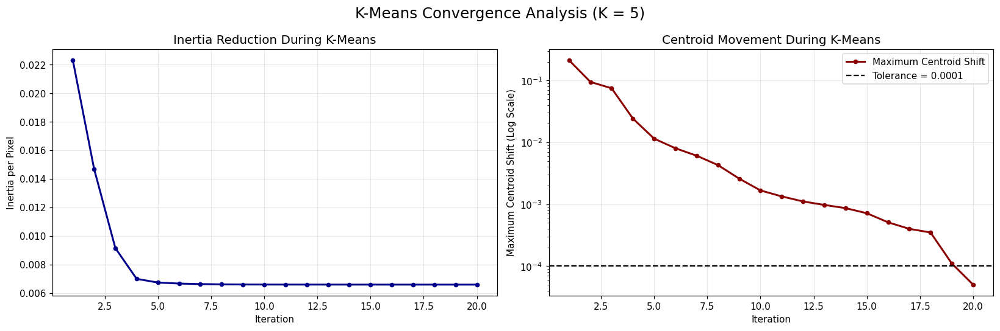

In [ ]:
# ============================================================
# 11. Visualize and Verify K-Means Convergence
# ============================================================

sample_inertia_history = (
    test_kmeans_result["inertia_history"]
)

sample_centroid_shift_history = (
    test_kmeans_result["centroid_shift_history"]
)

iteration_numbers = np.arange(
    1,
    len(sample_inertia_history) + 1
)

# Convert total inertia into inertia per pixel.
sample_inertia_per_pixel_history = (
    sample_inertia_history
    / len(k_selection_features)
)


# ------------------------------------------------------------
# Verify whether inertia decreased monotonically
# ------------------------------------------------------------

inertia_differences = np.diff(
    sample_inertia_history
)

inertia_is_non_increasing = np.all(
    inertia_differences <= 1e-8
)

initial_inertia = sample_inertia_history[0]
final_inertia = sample_inertia_history[-1]

inertia_reduction_percentage = (
    (initial_inertia - final_inertia)
    / initial_inertia
) * 100


print("K-Means convergence verification")
print("-" * 48)
print(
    f"Number of iterations       : "
    f"{test_kmeans_result['iterations']}"
)
print(
    f"Initial inertia            : "
    f"{initial_inertia:.6f}"
)
print(
    f"Final inertia              : "
    f"{final_inertia:.6f}"
)
print(
    f"Inertia reduction          : "
    f"{inertia_reduction_percentage:.2f}%"
)
print(
    f"Inertia non-increasing     : "
    f"{inertia_is_non_increasing}"
)
print(
    f"Final centroid shift       : "
    f"{sample_centroid_shift_history[-1]:.8f}"
)
print(
    f"Convergence tolerance      : "
    f"{TOLERANCE:.8f}"
)
print(
    f"Convergence condition met  : "
    f"{test_kmeans_result['converged']}"
)


# ------------------------------------------------------------
# Plot convergence behavior
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(15, 5)
)


# Plot 1: Inertia per pixel
axes[0].plot(
    iteration_numbers,
    sample_inertia_per_pixel_history,
    color="darkblue",
    marker="o",
    markersize=4,
    linewidth=2
)

axes[0].set_title(
    "Inertia Reduction During K-Means"
)
axes[0].set_xlabel("Iteration")
axes[0].set_ylabel("Inertia per Pixel")
axes[0].grid(alpha=0.3)


# Plot 2: Maximum centroid movement
axes[1].plot(
    iteration_numbers,
    sample_centroid_shift_history,
    color="darkred",
    marker="o",
    markersize=4,
    linewidth=2,
    label="Maximum Centroid Shift"
)

axes[1].axhline(
    y=TOLERANCE,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Tolerance = {TOLERANCE}"
)

axes[1].set_yscale("log")
axes[1].set_title(
    "Centroid Movement During K-Means"
)
axes[1].set_xlabel("Iteration")
axes[1].set_ylabel(
    "Maximum Centroid Shift (Log Scale)"
)
axes[1].grid(alpha=0.3)
axes[1].legend()


plt.suptitle(
    f"K-Means Convergence Analysis (K = {FINAL_K})",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 12. Evaluate Candidate K Values
# ============================================================

from sklearn.metrics import silhouette_score


# Multiple initializations reduce the effect of a poor
# centroid initialization.
K_SELECTION_N_INIT = 3

k_selection_records = []
k_selection_results = {}

k_selection_start_time = time.perf_counter()


for current_k in K_VALUES:

    print(f"Evaluating K = {current_k} ...")

    best_result_for_k = None

    # Run K-Means several times with different random seeds.
    for initialization_index in range(K_SELECTION_N_INIT):

        current_seed = (
            RANDOM_STATE
            + current_k * 100
            + initialization_index
        )

        current_result = kmeans_from_scratch(
            k_selection_features,
            number_of_clusters=current_k,
            max_iterations=MAX_ITERATIONS,
            tolerance=TOLERANCE,
            chunk_size=ASSIGNMENT_CHUNK_SIZE,
            random_state=current_seed,
            verbose=False
        )

        if (
            best_result_for_k is None
            or current_result["inertia"]
            < best_result_for_k["inertia"]
        ):
            best_result_for_k = current_result
            best_result_for_k["random_seed"] = current_seed

    # Calculate an approximate silhouette score using a
    # controlled number of pixels.
    silhouette_sample_count = min(
        SILHOUETTE_SAMPLE_SIZE,
        len(k_selection_features)
    )

    current_silhouette_score = silhouette_score(
        k_selection_features,
        best_result_for_k["labels"],
        metric="euclidean",
        sample_size=silhouette_sample_count,
        random_state=RANDOM_STATE
    )

    current_inertia_per_pixel = (
        best_result_for_k["inertia"]
        / len(k_selection_features)
    )

    k_selection_results[current_k] = (
        best_result_for_k
    )

    k_selection_records.append(
        {
            "K": current_k,
            "Inertia": best_result_for_k["inertia"],
            "Inertia per Pixel": current_inertia_per_pixel,
            "Silhouette Score": current_silhouette_score,
            "Iterations": best_result_for_k["iterations"],
            "Converged": best_result_for_k["converged"],
            "Best Seed": best_result_for_k["random_seed"],
            "Best Run Time (seconds)": (
                best_result_for_k["runtime_seconds"]
            )
        }
    )


k_selection_total_time = (
    time.perf_counter()
    - k_selection_start_time
)


# Convert the experiment results into a DataFrame.
k_evaluation_table = pd.DataFrame(
    k_selection_records
)

display_table = k_evaluation_table.copy()

display_table["Inertia"] = (
    display_table["Inertia"].round(4)
)

display_table["Inertia per Pixel"] = (
    display_table["Inertia per Pixel"].round(6)
)

display_table["Silhouette Score"] = (
    display_table["Silhouette Score"].round(4)
)

display_table["Best Run Time (seconds)"] = (
    display_table["Best Run Time (seconds)"].round(4)
)


print("\nCandidate K evaluation completed.")
print("-" * 52)
print(
    f"Number of K values tested : {len(K_VALUES)}"
)
print(
    f"Runs performed per K      : {K_SELECTION_N_INIT}"
)
print(
    f"Silhouette sample size    : "
    f"{silhouette_sample_count:,}"
)
print(
    f"Total evaluation time     : "
    f"{k_selection_total_time:.4f} seconds"
)

print("\nK evaluation results:")
display(display_table)

Evaluating K = 2 ...
Evaluating K = 3 ...
Evaluating K = 4 ...
Evaluating K = 5 ...
Evaluating K = 6 ...
Evaluating K = 7 ...
Evaluating K = 8 ...

Candidate K evaluation completed.
----------------------------------------------------
Number of K values tested : 7
Runs performed per K      : 3
Silhouette sample size    : 3,000
Total evaluation time     : 4.8626 seconds

K evaluation results:


,K,Inertia,Inertia per Pixel,Silhouette Score,Iterations,Converged,Best Seed,Best Run Time (seconds)
0,2,508.2275,0.025411,0.7538,5,True,243,0.0202
1,3,248.1882,0.012409,0.6924,13,True,342,0.0851
2,4,177.9618,0.008898,0.6544,17,True,444,0.0905
3,5,131.8456,0.006592,0.5361,22,True,542,0.1600
4,6,105.6834,0.005284,0.5270,43,True,642,0.3377
5,7,86.4972,0.004325,0.5350,50,True,743,0.4068
6,8,75.2061,0.003760,0.5225,34,True,842,0.3223


Final K-selection analysis
----------------------------------------------------
Elbow method suggested K       : 3
Silhouette method suggested K  : 2
Highest silhouette score       : 0.7538
Selected FINAL_K               : 3

Decision: The elbow value is selected because it provides a suitable balance between color separation and image detail.


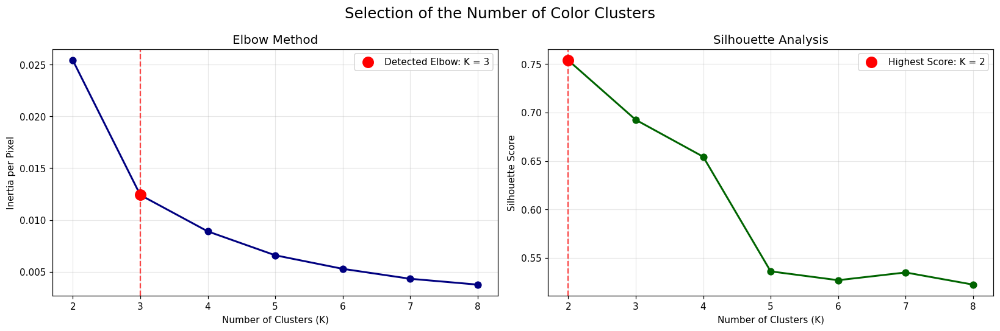

In [ ]:
# ============================================================
# 13. Select Final K Using Elbow and Silhouette Analysis
# ============================================================

evaluated_k_values = k_evaluation_table["K"].to_numpy()

evaluated_inertias = (
    k_evaluation_table["Inertia per Pixel"].to_numpy()
)

evaluated_silhouette_scores = (
    k_evaluation_table["Silhouette Score"].to_numpy()
)


# ------------------------------------------------------------
# Automatically detect the elbow using maximum distance
# from the line joining the first and final points.
# ------------------------------------------------------------

normalized_k_values = (
    evaluated_k_values - evaluated_k_values.min()
) / (
    evaluated_k_values.max()
    - evaluated_k_values.min()
)

normalized_inertias = (
    evaluated_inertias - evaluated_inertias.min()
) / (
    evaluated_inertias.max()
    - evaluated_inertias.min()
)

normalized_points = np.column_stack(
    (normalized_k_values, normalized_inertias)
)

line_start = normalized_points[0]
line_end = normalized_points[-1]

line_vector = line_end - line_start
line_length = np.linalg.norm(line_vector)

relative_points = normalized_points - line_start

perpendicular_distances = np.abs(
    line_vector[0] * relative_points[:, 1]
    - line_vector[1] * relative_points[:, 0]
) / line_length

elbow_index = int(
    np.argmax(perpendicular_distances)
)

elbow_selected_k = int(
    evaluated_k_values[elbow_index]
)


# Select the K having the highest silhouette score.
silhouette_best_index = int(
    np.argmax(evaluated_silhouette_scores)
)

silhouette_selected_k = int(
    evaluated_k_values[silhouette_best_index]
)

best_silhouette_value = float(
    evaluated_silhouette_scores[
        silhouette_best_index
    ]
)


# Use the elbow K as the final choice because it preserves
# more meaningful image detail while limiting complexity.
FINAL_K = elbow_selected_k


# Identify candidate values that did not converge.
non_converged_k_values = (
    k_evaluation_table.loc[
        ~k_evaluation_table["Converged"],
        "K"
    ]
    .astype(int)
    .tolist()
)


print("Final K-selection analysis")
print("-" * 52)
print(
    f"Elbow method suggested K       : "
    f"{elbow_selected_k}"
)
print(
    f"Silhouette method suggested K  : "
    f"{silhouette_selected_k}"
)
print(
    f"Highest silhouette score       : "
    f"{best_silhouette_value:.4f}"
)
print(
    f"Selected FINAL_K               : "
    f"{FINAL_K}"
)

if non_converged_k_values:
    print(
        f"Non-converged candidate K      : "
        f"{non_converged_k_values}"
    )

print(
    "\nDecision: The elbow value is selected because it "
    "provides a suitable balance between color separation "
    "and image detail."
)


# ------------------------------------------------------------
# Plot the evaluation curves
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(15, 5)
)


# Elbow curve
axes[0].plot(
    evaluated_k_values,
    evaluated_inertias,
    color="navy",
    marker="o",
    markersize=7,
    linewidth=2
)

axes[0].scatter(
    elbow_selected_k,
    evaluated_inertias[elbow_index],
    color="red",
    s=130,
    zorder=3,
    label=f"Detected Elbow: K = {elbow_selected_k}"
)

axes[0].axvline(
    elbow_selected_k,
    color="red",
    linestyle="--",
    alpha=0.7
)

axes[0].set_title("Elbow Method")
axes[0].set_xlabel("Number of Clusters (K)")
axes[0].set_ylabel("Inertia per Pixel")
axes[0].set_xticks(evaluated_k_values)
axes[0].grid(alpha=0.3)
axes[0].legend()


# Silhouette curve
axes[1].plot(
    evaluated_k_values,
    evaluated_silhouette_scores,
    color="darkgreen",
    marker="o",
    markersize=7,
    linewidth=2
)

axes[1].scatter(
    silhouette_selected_k,
    best_silhouette_value,
    color="red",
    s=130,
    zorder=3,
    label=(
        f"Highest Score: "
        f"K = {silhouette_selected_k}"
    )
)

axes[1].axvline(
    silhouette_selected_k,
    color="red",
    linestyle="--",
    alpha=0.7
)

axes[1].set_title("Silhouette Analysis")
axes[1].set_xlabel("Number of Clusters (K)")
axes[1].set_ylabel("Silhouette Score")
axes[1].set_xticks(evaluated_k_values)
axes[1].grid(alpha=0.3)
axes[1].legend()


plt.suptitle(
    "Selection of the Number of Color Clusters",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 14. Run Final K-Means on All Image Pixels
# ============================================================

FINAL_N_INIT = 5

final_run_records = []
final_kmeans_result = None

complete_clustering_start_time = time.perf_counter()


for initialization_index in range(FINAL_N_INIT):

    current_seed = (
        RANDOM_STATE
        + 1000
        + initialization_index
    )

    print(
        f"Running final initialization "
        f"{initialization_index + 1}/{FINAL_N_INIT} "
        f"with seed {current_seed} ..."
    )

    current_final_result = kmeans_from_scratch(
        pixel_features,
        number_of_clusters=FINAL_K,
        max_iterations=MAX_ITERATIONS,
        tolerance=TOLERANCE,
        chunk_size=ASSIGNMENT_CHUNK_SIZE,
        random_state=current_seed,
        verbose=False
    )

    current_inertia_per_pixel = (
        current_final_result["inertia"]
        / number_of_pixels
    )

    final_run_records.append(
        {
            "Initialization": initialization_index + 1,
            "Random Seed": current_seed,
            "Inertia": current_final_result["inertia"],
            "Inertia per Pixel": current_inertia_per_pixel,
            "Iterations": current_final_result["iterations"],
            "Converged": current_final_result["converged"],
            "Runtime (seconds)": (
                current_final_result["runtime_seconds"]
            )
        }
    )

    # Retain the result with the lowest final inertia.
    if (
        final_kmeans_result is None
        or current_final_result["inertia"]
        < final_kmeans_result["inertia"]
    ):
        final_kmeans_result = current_final_result
        final_kmeans_result["random_seed"] = current_seed
        final_kmeans_result["initialization_number"] = (
            initialization_index + 1
        )


complete_clustering_time = (
    time.perf_counter()
    - complete_clustering_start_time
)


# Extract the selected final clustering results.
final_centroids = final_kmeans_result["centroids"]
final_pixel_labels = final_kmeans_result["labels"]
final_squared_distances = (
    final_kmeans_result["squared_distances"]
)
final_cluster_counts = (
    final_kmeans_result["cluster_counts"]
)


# Validate the final result.
if len(final_pixel_labels) != number_of_pixels:
    raise ValueError(
        "Not every image pixel received a cluster label."
    )

if final_cluster_counts.sum() != number_of_pixels:
    raise ValueError(
        "The final cluster counts do not equal the total "
        "number of pixels."
    )


# Create a comparison table for all final runs.
final_run_table = pd.DataFrame(
    final_run_records
)

final_run_display = final_run_table.copy()

final_run_display["Inertia"] = (
    final_run_display["Inertia"].round(4)
)

final_run_display["Inertia per Pixel"] = (
    final_run_display["Inertia per Pixel"].round(6)
)

final_run_display["Runtime (seconds)"] = (
    final_run_display["Runtime (seconds)"].round(4)
)


print("\nFinal full-image clustering completed.")
print("-" * 58)
print(f"Selected number of clusters : {FINAL_K}")
print(f"Total clustered pixels      : {len(final_pixel_labels):,}")
print(
    f"Selected initialization     : "
    f"{final_kmeans_result['initialization_number']}"
)
print(
    f"Selected random seed        : "
    f"{final_kmeans_result['random_seed']}"
)
print(
    f"Converged                   : "
    f"{final_kmeans_result['converged']}"
)
print(
    f"Iterations completed        : "
    f"{final_kmeans_result['iterations']}"
)
print(
    f"Final inertia               : "
    f"{final_kmeans_result['inertia']:.6f}"
)
print(
    f"Final inertia per pixel     : "
    f"{final_kmeans_result['inertia'] / number_of_pixels:.8f}"
)
print(
    f"Total multi-run time        : "
    f"{complete_clustering_time:.4f} seconds"
)

print("\nComparison of final initializations:")
display(final_run_display)

Running final initialization 1/5 with seed 1042 ...
Running final initialization 2/5 with seed 1043 ...
Running final initialization 3/5 with seed 1044 ...
Running final initialization 4/5 with seed 1045 ...
Running final initialization 5/5 with seed 1046 ...

Final full-image clustering completed.
----------------------------------------------------------
Selected number of clusters : 3
Total clustered pixels      : 424,000
Selected initialization     : 1
Selected random seed        : 1042
Converged                   : True
Iterations completed        : 14
Final inertia               : 5212.763244
Final inertia per pixel     : 0.01229425
Total multi-run time        : 5.8015 seconds

Comparison of final initializations:


,Initialization,Random Seed,Inertia,Inertia per Pixel,Iterations,Converged,Runtime (seconds)
0,1,1042,5212.7632,0.012294,14,True,1.7324
1,2,1043,5212.7635,0.012294,12,True,1.0161
2,3,1044,5212.7639,0.012294,14,True,1.1763
3,4,1045,5212.7638,0.012294,11,True,0.9454
4,5,1046,5212.7633,0.012294,11,True,0.9300


Segmented image reconstructed successfully.
------------------------------------------------------
Segmented image shape     : (530, 800, 3)
Label map shape           : (530, 800)
Unique cluster labels     : [0, 1, 2]
Number of color regions   : 3


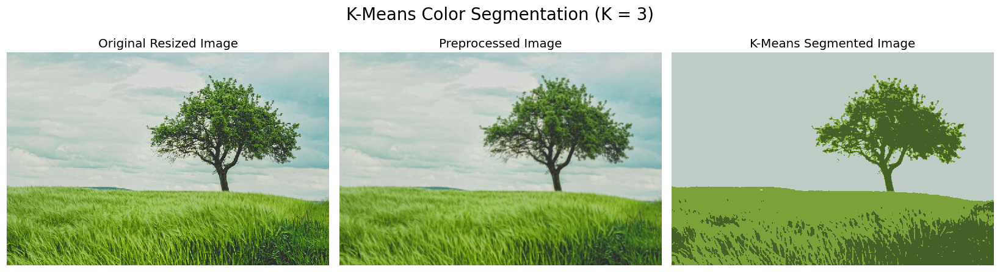

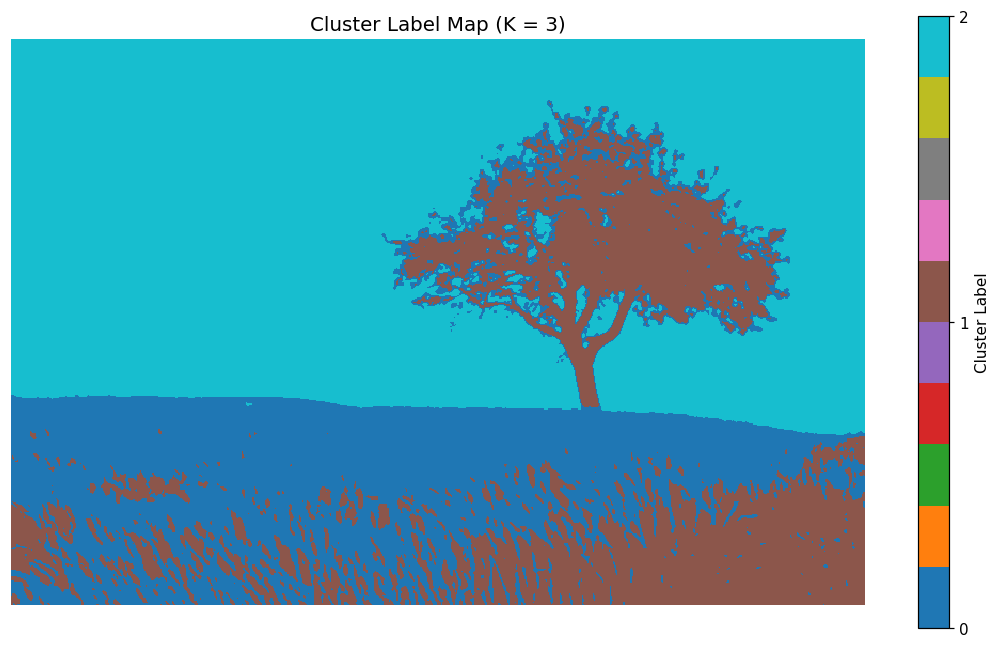

In [ ]:
# ============================================================
# 15. Reconstruct the Segmented Image
# ============================================================

# Replace every normalized pixel feature with the RGB color
# of its assigned final centroid.
segmented_pixel_features = (
    final_centroids[final_pixel_labels]
)


# Convert the N × 3 feature matrix back into H × W × 3.
segmented_image_float = segmented_pixel_features.reshape(
    processed_height,
    processed_width,
    3
)


# Convert normalized RGB values back to uint8 [0, 255].
segmented_image_np = np.clip(
    np.round(segmented_image_float * 255),
    0,
    255
).astype(np.uint8)


# Create a PIL image for display and later export.
segmented_image = Image.fromarray(
    segmented_image_np
)


# Convert the one-dimensional labels into an image-shaped map.
cluster_label_map = final_pixel_labels.reshape(
    processed_height,
    processed_width
)


# Validate reconstruction.
unique_cluster_labels = np.unique(
    cluster_label_map
)

if segmented_image_np.shape != processed_image_np.shape:
    raise ValueError(
        "The segmented image shape does not match the "
        "processed image shape."
    )

if len(unique_cluster_labels) != FINAL_K:
    raise ValueError(
        "The segmented image does not contain the expected "
        "number of clusters."
    )


print("Segmented image reconstructed successfully.")
print("-" * 54)
print(
    f"Segmented image shape     : "
    f"{segmented_image_np.shape}"
)
print(
    f"Label map shape           : "
    f"{cluster_label_map.shape}"
)
print(
    f"Unique cluster labels     : "
    f"{unique_cluster_labels.tolist()}"
)
print(
    f"Number of color regions   : "
    f"{len(unique_cluster_labels)}"
)


# Display the main segmentation result.
img_grid(
    [
        resized_image,
        processed_image,
        segmented_image
    ],
    title=f"K-Means Color Segmentation (K = {FINAL_K})",
    individual_subtitle=[
        "Original Resized Image",
        "Preprocessed Image",
        "K-Means Segmented Image"
    ],
    col_wrap=3,
    height=4
)


# Display the cluster-label map.
plt.figure(figsize=(10, 6))

label_map_plot = plt.imshow(
    cluster_label_map,
    cmap="tab10",
    vmin=0,
    vmax=FINAL_K - 1
)

colorbar = plt.colorbar(
    label_map_plot,
    ticks=np.arange(FINAL_K)
)

colorbar.set_label("Cluster Label")

plt.title(
    f"Cluster Label Map (K = {FINAL_K})"
)
plt.axis("off")
plt.tight_layout()
plt.show()

Dominant color analysis completed.
----------------------------------------------------
Number of dominant colors : 3
Total cluster pixels      : 424,000
Total percentage          : 100.00%

Dominant color information:


,Dominance Rank,Cluster,Label,RGB Color,Hex Color,Pixel Count,Percentage (%)
0,1,Cluster 3,2,"(190, 204, 197)",#BECCC5,229666,54.17
1,2,Cluster 1,0,"(124, 161, 58)",#7CA13A,109283,25.77
2,3,Cluster 2,1,"(69, 97, 39)",#456127,85051,20.06


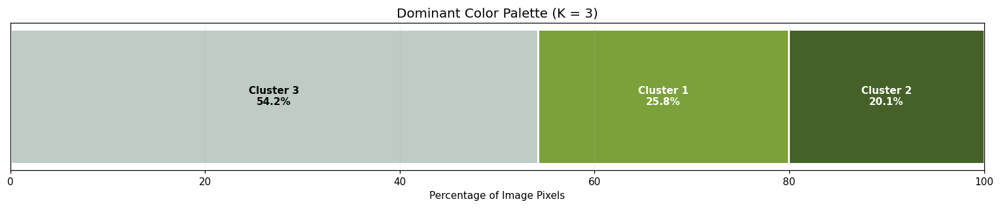

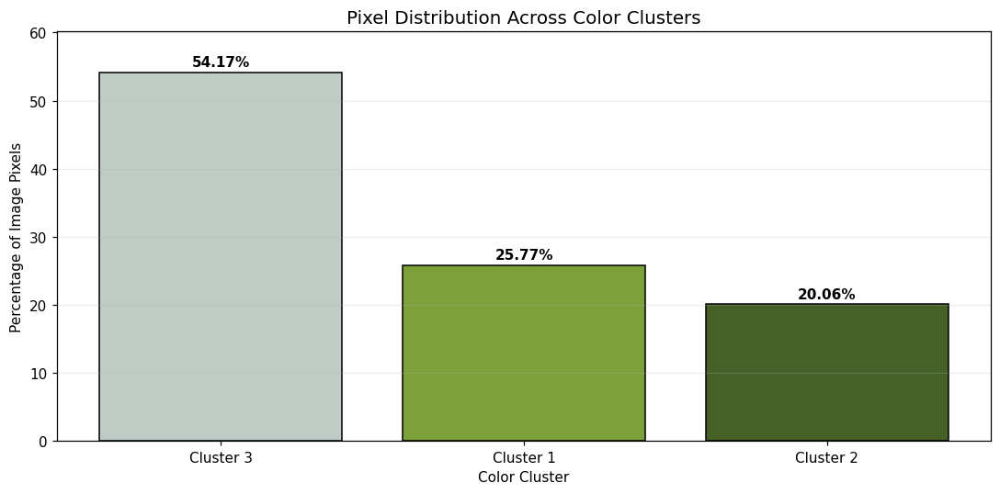

In [ ]:
# ============================================================
# 16. Analyze the Dominant Color Palette
# ============================================================

# Convert normalized centroid values into RGB integers.
centroid_colors_uint8 = np.clip(
    np.round(final_centroids * 255),
    0,
    255
).astype(np.uint8)


# Calculate the percentage occupied by each cluster.
final_cluster_percentages = (
    final_cluster_counts
    / number_of_pixels
) * 100


# Sort clusters from the most dominant to the least dominant.
dominance_order = np.argsort(
    final_cluster_counts
)[::-1]


def rgb_to_hex(rgb_color):
    """Convert an RGB color into a hexadecimal color code."""

    red, green, blue = [
        int(value)
        for value in rgb_color
    ]

    return f"#{red:02X}{green:02X}{blue:02X}"


# Create the dominant-color summary table.
dominant_color_records = []

for dominance_rank, cluster_index in enumerate(
    dominance_order,
    start=1
):
    rgb_color = centroid_colors_uint8[
        cluster_index
    ]

    dominant_color_records.append(
        {
            "Dominance Rank": dominance_rank,
            "Cluster": f"Cluster {cluster_index + 1}",
            "Label": int(cluster_index),
            "RGB Color": (
                f"({rgb_color[0]}, "
                f"{rgb_color[1]}, "
                f"{rgb_color[2]})"
            ),
            "Hex Color": rgb_to_hex(rgb_color),
            "Pixel Count": int(
                final_cluster_counts[cluster_index]
            ),
            "Percentage (%)": float(
                final_cluster_percentages[cluster_index]
            )
        }
    )


dominant_color_table = pd.DataFrame(
    dominant_color_records
)

dominant_color_display = (
    dominant_color_table.copy()
)

dominant_color_display["Percentage (%)"] = (
    dominant_color_display["Percentage (%)"].round(2)
)


print("Dominant color analysis completed.")
print("-" * 52)
print(
    f"Number of dominant colors : "
    f"{len(centroid_colors_uint8)}"
)
print(
    f"Total cluster pixels      : "
    f"{final_cluster_counts.sum():,}"
)
print(
    f"Total percentage          : "
    f"{final_cluster_percentages.sum():.2f}%"
)

print("\nDominant color information:")
display(dominant_color_display)


# ------------------------------------------------------------
# Display a proportional dominant-color palette
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(14, 3)
)

current_left_position = 0

for cluster_index in dominance_order:

    cluster_percentage = (
        final_cluster_percentages[cluster_index]
    )

    normalized_color = (
        centroid_colors_uint8[cluster_index]
        / 255.0
    )

    ax.barh(
        y=0,
        width=cluster_percentage,
        left=current_left_position,
        height=0.65,
        color=normalized_color,
        edgecolor="white",
        linewidth=2
    )

    # Select readable text color using perceived brightness.
    red, green, blue = normalized_color

    perceived_brightness = (
        0.299 * red
        + 0.587 * green
        + 0.114 * blue
    )

    text_color = (
        "black"
        if perceived_brightness > 0.55
        else "white"
    )

    if cluster_percentage >= 5:
        ax.text(
            current_left_position
            + cluster_percentage / 2,
            0,
            (
                f"Cluster {cluster_index + 1}\n"
                f"{cluster_percentage:.1f}%"
            ),
            ha="center",
            va="center",
            color=text_color,
            fontsize=10,
            fontweight="bold"
        )

    current_left_position += cluster_percentage


ax.set_xlim(0, 100)
ax.set_yticks([])
ax.set_xlabel("Percentage of Image Pixels")
ax.set_title(
    f"Dominant Color Palette (K = {FINAL_K})"
)
ax.grid(
    axis="x",
    alpha=0.2
)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Plot cluster pixel distribution
# ------------------------------------------------------------

cluster_names_by_dominance = [
    f"Cluster {cluster_index + 1}"
    for cluster_index in dominance_order
]

percentages_by_dominance = (
    final_cluster_percentages[dominance_order]
)

bar_colors = (
    centroid_colors_uint8[dominance_order]
    / 255.0
)


plt.figure(figsize=(10, 5))

bars = plt.bar(
    cluster_names_by_dominance,
    percentages_by_dominance,
    color=bar_colors,
    edgecolor="black"
)

for bar, percentage in zip(
    bars,
    percentages_by_dominance
):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.5,
        f"{percentage:.2f}%",
        ha="center",
        va="bottom",
        fontweight="bold"
    )

plt.title("Pixel Distribution Across Color Clusters")
plt.xlabel("Color Cluster")
plt.ylabel("Percentage of Image Pixels")
plt.ylim(
    0,
    percentages_by_dominance.max() + 6
)
plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()
plt.show()

Individual region masks generated successfully.
----------------------------------------------------------
Number of binary masks    : 3
Pixels covered by masks   : True
Exactly one mask per pixel: True


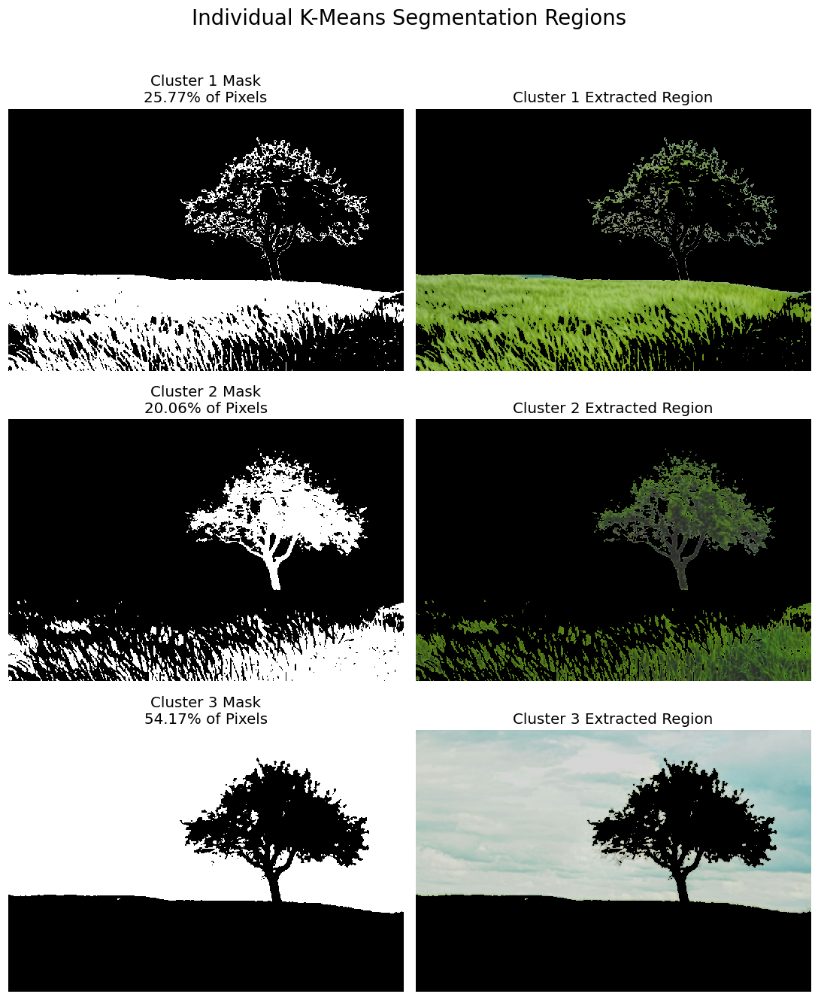

In [ ]:
# ============================================================
# 17. Generate Binary Masks and Extracted Color Regions
# ============================================================

cluster_binary_masks = []
cluster_extracted_regions = []
mask_and_region_images = []
mask_and_region_titles = []


for cluster_index in range(FINAL_K):

    # Create a Boolean mask for the current cluster.
    boolean_mask = (
        cluster_label_map == cluster_index
    )

    # Convert the Boolean mask into a visible binary image.
    binary_mask = (
        boolean_mask.astype(np.uint8) * 255
    )

    # Retain the original processed pixels belonging to the
    # cluster and use black for all remaining pixels.
    extracted_region = np.zeros_like(
        processed_image_np
    )

    extracted_region[boolean_mask] = (
        processed_image_np[boolean_mask]
    )

    cluster_binary_masks.append(binary_mask)
    cluster_extracted_regions.append(
        extracted_region
    )

    cluster_percentage = (
        final_cluster_percentages[cluster_index]
    )

    mask_and_region_images.extend(
        [
            binary_mask,
            extracted_region
        ]
    )

    mask_and_region_titles.extend(
        [
            (
                f"Cluster {cluster_index + 1} Mask\n"
                f"{cluster_percentage:.2f}% of Pixels"
            ),
            (
                f"Cluster {cluster_index + 1} "
                f"Extracted Region"
            )
        ]
    )


# ------------------------------------------------------------
# Validate that every pixel belongs to exactly one mask
# ------------------------------------------------------------

mask_stack = np.stack(
    [
        mask > 0
        for mask in cluster_binary_masks
    ],
    axis=0
)

pixel_membership_count = np.sum(
    mask_stack,
    axis=0
)

all_pixels_covered = np.all(
    pixel_membership_count >= 1
)

no_mask_overlap = np.all(
    pixel_membership_count == 1
)


print("Individual region masks generated successfully.")
print("-" * 58)
print(
    f"Number of binary masks    : "
    f"{len(cluster_binary_masks)}"
)
print(
    f"Pixels covered by masks   : "
    f"{all_pixels_covered}"
)
print(
    f"Exactly one mask per pixel: "
    f"{no_mask_overlap}"
)


# Display each binary mask beside its extracted region.
img_grid(
    mask_and_region_images,
    title="Individual K-Means Segmentation Regions",
    individual_subtitle=mask_and_region_titles,
    col_wrap=2,
    height=4
)

Segmentation boundary overlay created successfully.
------------------------------------------------------------
Boundary pixel count      : 73,041
Boundary pixel percentage : 17.23%
Boundary color            : (np.uint8(255), np.uint8(0), np.uint8(0))


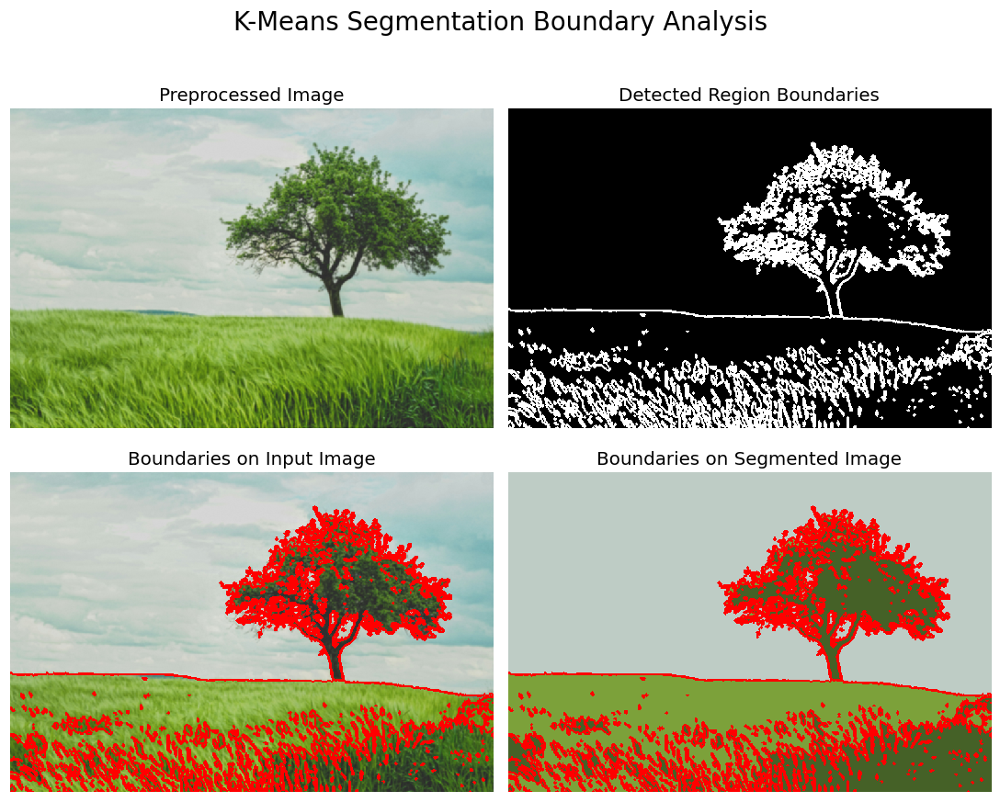

In [ ]:
# ============================================================
# 18. Detect Region Boundaries and Create an Overlay
# ============================================================

from scipy.ndimage import binary_dilation


def detect_cluster_boundaries(label_map):
    """
    Detect boundaries where horizontally or vertically adjacent
    pixels have different cluster labels.
    """

    label_map = np.asarray(label_map)

    if label_map.ndim != 2:
        raise ValueError(
            "The cluster label map must be two-dimensional."
        )

    boundary_mask = np.zeros(
        label_map.shape,
        dtype=bool
    )

    # Detect horizontal label changes.
    horizontal_changes = (
        label_map[:, 1:]
        != label_map[:, :-1]
    )

    boundary_mask[:, 1:] |= horizontal_changes
    boundary_mask[:, :-1] |= horizontal_changes

    # Detect vertical label changes.
    vertical_changes = (
        label_map[1:, :]
        != label_map[:-1, :]
    )

    boundary_mask[1:, :] |= vertical_changes
    boundary_mask[:-1, :] |= vertical_changes

    return boundary_mask


# Detect the initial cluster boundaries.
boundary_mask_boolean = detect_cluster_boundaries(
    cluster_label_map
)


# Slightly enlarge boundaries to improve their visibility.
BOUNDARY_THICKNESS = 1

visible_boundary_mask = binary_dilation(
    boundary_mask_boolean,
    iterations=BOUNDARY_THICKNESS
)


# Convert the boundary mask into a displayable image.
boundary_mask_image = (
    visible_boundary_mask.astype(np.uint8) * 255
)


# Create boundary overlays.
original_boundary_overlay = (
    processed_image_np.copy()
)

segmented_boundary_overlay = (
    segmented_image_np.copy()
)

# Use red to represent region boundaries.
boundary_color = np.array(
    [255, 0, 0],
    dtype=np.uint8
)

original_boundary_overlay[
    visible_boundary_mask
] = boundary_color

segmented_boundary_overlay[
    visible_boundary_mask
] = boundary_color


# Calculate boundary statistics.
boundary_pixel_count = int(
    visible_boundary_mask.sum()
)

boundary_percentage = (
    boundary_pixel_count
    / number_of_pixels
) * 100


print("Segmentation boundary overlay created successfully.")
print("-" * 60)
print(
    f"Boundary pixel count      : "
    f"{boundary_pixel_count:,}"
)
print(
    f"Boundary pixel percentage : "
    f"{boundary_percentage:.2f}%"
)
print(
    f"Boundary color            : "
    f"{tuple(boundary_color)}"
)


# Display boundary detection results.
img_grid(
    [
        processed_image_np,
        boundary_mask_image,
        original_boundary_overlay,
        segmented_boundary_overlay
    ],
    title="K-Means Segmentation Boundary Analysis",
    individual_subtitle=[
        "Preprocessed Image",
        "Detected Region Boundaries",
        "Boundaries on Input Image",
        "Boundaries on Segmented Image"
    ],
    col_wrap=2,
    height=4
)

In [ ]:
# ============================================================
# 19. Quantitative Evaluation of the Final Segmentation
# ============================================================

from skimage.metrics import structural_similarity


# Convert images to float before calculating errors.
reference_image_float = processed_image_np.astype(
    np.float64
)

segmented_image_evaluation_float = (
    segmented_image_np.astype(np.float64)
)


# ------------------------------------------------------------
# Calculate reconstruction-quality metrics
# ------------------------------------------------------------

pixel_errors = (
    reference_image_float
    - segmented_image_evaluation_float
)

mean_squared_error = np.mean(
    pixel_errors ** 2
)

root_mean_squared_error = np.sqrt(
    mean_squared_error
)

mean_absolute_error = np.mean(
    np.abs(pixel_errors)
)


if mean_squared_error == 0:
    peak_signal_to_noise_ratio = np.inf
else:
    peak_signal_to_noise_ratio = (
        10
        * np.log10(
            (255.0 ** 2)
            / mean_squared_error
        )
    )


structural_similarity_score = structural_similarity(
    processed_image_np,
    segmented_image_np,
    channel_axis=2,
    data_range=255
)


# ------------------------------------------------------------
# Retrieve clustering-quality information
# ------------------------------------------------------------

selected_silhouette_score = float(
    k_evaluation_table.loc[
        k_evaluation_table["K"] == FINAL_K,
        "Silhouette Score"
    ].iloc[0]
)

final_inertia_per_pixel = (
    final_kmeans_result["inertia"]
    / number_of_pixels
)


# ------------------------------------------------------------
# Analyze color reduction
# ------------------------------------------------------------

original_unique_color_count = len(
    np.unique(
        processed_image_np.reshape(-1, 3),
        axis=0
    )
)

segmented_unique_color_count = len(
    np.unique(
        segmented_image_np.reshape(-1, 3),
        axis=0
    )
)

color_reduction_percentage = (
    1
    - (
        segmented_unique_color_count
        / original_unique_color_count
    )
) * 100


# ------------------------------------------------------------
# Estimate palette-based theoretical compression
# ------------------------------------------------------------

original_bits_per_pixel = 24

label_bits_per_pixel = max(
    1,
    int(np.ceil(np.log2(FINAL_K)))
)

original_image_bits = (
    number_of_pixels
    * original_bits_per_pixel
)

segmented_representation_bits = (
    number_of_pixels
    * label_bits_per_pixel
    + FINAL_K * 24
)

theoretical_compression_ratio = (
    original_image_bits
    / segmented_representation_bits
)


# Store numeric values for later export.
evaluation_metrics = {
    "Selected K": FINAL_K,
    "Total Pixels": number_of_pixels,
    "Iterations": final_kmeans_result["iterations"],
    "Converged": final_kmeans_result["converged"],
    "Final Inertia": final_kmeans_result["inertia"],
    "Inertia per Pixel": final_inertia_per_pixel,
    "Silhouette Score": selected_silhouette_score,
    "MSE": mean_squared_error,
    "RMSE": root_mean_squared_error,
    "MAE": mean_absolute_error,
    "PSNR (dB)": peak_signal_to_noise_ratio,
    "SSIM": structural_similarity_score,
    "Original Unique Colors": original_unique_color_count,
    "Segmented Unique Colors": segmented_unique_color_count,
    "Color Reduction (%)": color_reduction_percentage,
    "Boundary Pixels": boundary_pixel_count,
    "Boundary Percentage (%)": boundary_percentage,
    "Selected Run Time (seconds)": (
        final_kmeans_result["runtime_seconds"]
    ),
    "Total Multi-Run Time (seconds)": (
        complete_clustering_time
    ),
    "Theoretical Compression Ratio": (
        theoretical_compression_ratio
    )
}


# Create a report-ready evaluation table.
evaluation_summary_table = pd.DataFrame(
    [
        {
            "Metric": "Selected K",
            "Value": str(FINAL_K),
            "Meaning": "Number of dominant color regions"
        },
        {
            "Metric": "Converged",
            "Value": str(
                final_kmeans_result["converged"]
            ),
            "Meaning": "Whether the stopping criterion was met"
        },
        {
            "Metric": "Iterations",
            "Value": str(
                final_kmeans_result["iterations"]
            ),
            "Meaning": "Iterations required for convergence"
        },
        {
            "Metric": "Inertia per Pixel",
            "Value": f"{final_inertia_per_pixel:.6f}",
            "Meaning": "Average within-cluster squared distance"
        },
        {
            "Metric": "Silhouette Score",
            "Value": f"{selected_silhouette_score:.4f}",
            "Meaning": "Separation and compactness of clusters"
        },
        {
            "Metric": "MSE",
            "Value": f"{mean_squared_error:.4f}",
            "Meaning": "Mean squared color reconstruction error"
        },
        {
            "Metric": "RMSE",
            "Value": f"{root_mean_squared_error:.4f}",
            "Meaning": "Root mean squared color error"
        },
        {
            "Metric": "MAE",
            "Value": f"{mean_absolute_error:.4f}",
            "Meaning": "Mean absolute color error"
        },
        {
            "Metric": "PSNR",
            "Value": f"{peak_signal_to_noise_ratio:.4f} dB",
            "Meaning": "Color-quantization reconstruction quality"
        },
        {
            "Metric": "SSIM",
            "Value": f"{structural_similarity_score:.4f}",
            "Meaning": "Structural similarity with the input image"
        },
        {
            "Metric": "Original Unique Colors",
            "Value": f"{original_unique_color_count:,}",
            "Meaning": "Unique colors before segmentation"
        },
        {
            "Metric": "Segmented Unique Colors",
            "Value": f"{segmented_unique_color_count:,}",
            "Meaning": "Unique colors after segmentation"
        },
        {
            "Metric": "Color Reduction",
            "Value": f"{color_reduction_percentage:.2f}%",
            "Meaning": "Reduction in the number of image colors"
        },
        {
            "Metric": "Boundary Percentage",
            "Value": f"{boundary_percentage:.2f}%",
            "Meaning": "Pixels used to visualize region boundaries"
        },
        {
            "Metric": "Theoretical Compression",
            "Value": f"{theoretical_compression_ratio:.2f}:1",
            "Meaning": "Palette-index representation estimate"
        }
    ]
)


print("Final quantitative evaluation completed.")
print("-" * 58)
display(evaluation_summary_table)

Final quantitative evaluation completed.
----------------------------------------------------------


,Metric,Value,Meaning
0,Selected K,3,Number of dominant color regions
1,Converged,True,Whether the stopping criterion was met
2,Iterations,14,Iterations required for convergence
3,Inertia per Pixel,0.012294,Average within-cluster squared distance
4,Silhouette Score,0.6924,Separation and compactness of clusters
5,MSE,266.5119,Mean squared color reconstruction error
6,RMSE,16.3252,Root mean squared color error
7,MAE,11.9870,Mean absolute color error
8,PSNR,23.8736 dB,Color-quantization reconstruction quality
9,SSIM,0.7555,Structural similarity with the input image


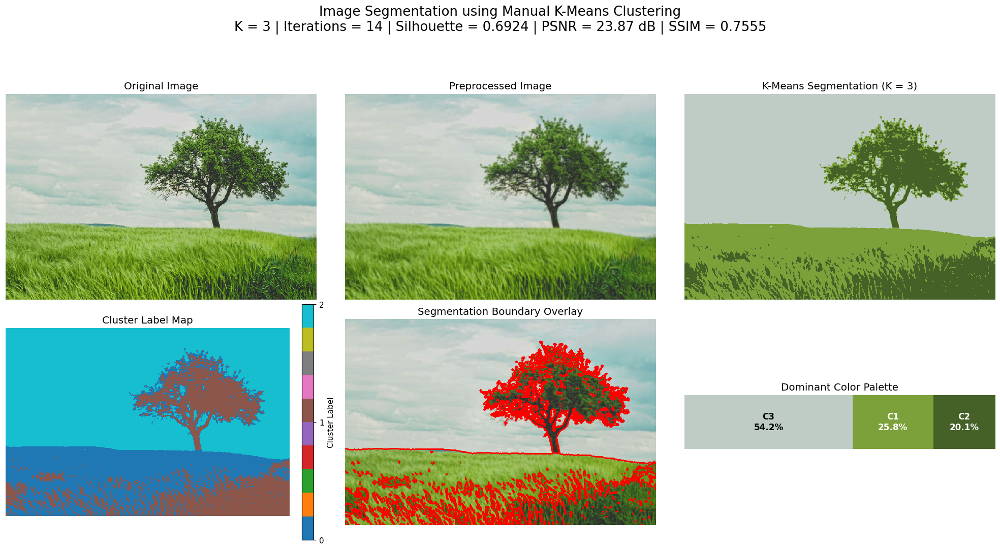

Final project dashboard generated successfully.
Exact color reduction: 99.9964%


In [ ]:
# ============================================================
# 20. Create the Final Project Result Dashboard
# ============================================================

# ------------------------------------------------------------
# Create a proportional palette image
# ------------------------------------------------------------

palette_width = 800
palette_height = 140

proportional_palette_image = np.zeros(
    (palette_height, palette_width, 3),
    dtype=np.uint8
)

palette_segments = []
current_palette_position = 0
cumulative_percentage = 0.0


for order_index, cluster_index in enumerate(
    dominance_order
):

    cluster_percentage = (
        final_cluster_percentages[cluster_index]
    )

    cumulative_percentage += cluster_percentage

    if order_index == len(dominance_order) - 1:
        next_palette_position = palette_width
    else:
        next_palette_position = int(
            round(
                cumulative_percentage
                / 100
                * palette_width
            )
        )

    proportional_palette_image[
        :,
        current_palette_position:next_palette_position
    ] = centroid_colors_uint8[cluster_index]

    palette_segments.append(
        {
            "cluster_index": cluster_index,
            "start": current_palette_position,
            "end": next_palette_position,
            "percentage": cluster_percentage
        }
    )

    current_palette_position = next_palette_position


# ------------------------------------------------------------
# Create the dashboard
# ------------------------------------------------------------

fig, axes = plt.subplots(
    2,
    3,
    figsize=(18, 10)
)


# 1. Original resized image
axes[0, 0].imshow(resized_image)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")


# 2. Preprocessed image
axes[0, 1].imshow(processed_image_np)
axes[0, 1].set_title("Preprocessed Image")
axes[0, 1].axis("off")


# 3. Segmented image
axes[0, 2].imshow(segmented_image_np)
axes[0, 2].set_title(
    f"K-Means Segmentation (K = {FINAL_K})"
)
axes[0, 2].axis("off")


# 4. Cluster label map
label_map_display = axes[1, 0].imshow(
    cluster_label_map,
    cmap="tab10",
    vmin=0,
    vmax=FINAL_K - 1
)

axes[1, 0].set_title("Cluster Label Map")
axes[1, 0].axis("off")

dashboard_colorbar = fig.colorbar(
    label_map_display,
    ax=axes[1, 0],
    ticks=np.arange(FINAL_K),
    fraction=0.046,
    pad=0.04
)

dashboard_colorbar.set_label("Cluster Label")


# 5. Boundary overlay
axes[1, 1].imshow(
    original_boundary_overlay
)

axes[1, 1].set_title(
    "Segmentation Boundary Overlay"
)
axes[1, 1].axis("off")


# 6. Dominant color palette
axes[1, 2].imshow(
    proportional_palette_image
)

axes[1, 2].set_title(
    "Dominant Color Palette"
)
axes[1, 2].axis("off")


# Add cluster labels to the palette.
for segment in palette_segments:

    cluster_index = segment["cluster_index"]
    start_position = segment["start"]
    end_position = segment["end"]
    cluster_percentage = segment["percentage"]

    segment_center = (
        start_position + end_position
    ) / 2

    normalized_color = (
        centroid_colors_uint8[cluster_index]
        / 255.0
    )

    red, green, blue = normalized_color

    perceived_brightness = (
        0.299 * red
        + 0.587 * green
        + 0.114 * blue
    )

    text_color = (
        "black"
        if perceived_brightness > 0.55
        else "white"
    )

    if cluster_percentage >= 5:
        axes[1, 2].text(
            segment_center,
            palette_height / 2,
            (
                f"C{cluster_index + 1}\n"
                f"{cluster_percentage:.1f}%"
            ),
            color=text_color,
            ha="center",
            va="center",
            fontsize=11,
            fontweight="bold"
        )


# Main dashboard title with important evaluation metrics.
fig.suptitle(
    (
        "Image Segmentation using Manual K-Means Clustering\n"
        f"K = {FINAL_K} | "
        f"Iterations = {final_kmeans_result['iterations']} | "
        f"Silhouette = {selected_silhouette_score:.4f} | "
        f"PSNR = {peak_signal_to_noise_ratio:.2f} dB | "
        f"SSIM = {structural_similarity_score:.4f}"
    ),
    fontsize=17,
    y=0.98
)

plt.tight_layout(
    rect=[0, 0, 1, 0.93]
)

plt.show()


print("Final project dashboard generated successfully.")
print(
    f"Exact color reduction: "
    f"{color_reduction_percentage:.4f}%"
)

In [ ]:
# ============================================================
# 21. Save and Download the Primary Segmentation Results
# ============================================================

import os
import shutil


# ------------------------------------------------------------
# Create the result directory
# ------------------------------------------------------------

PRIMARY_RESULT_DIRECTORY = (
    "kmeans_primary_image_results"
)

os.makedirs(
    PRIMARY_RESULT_DIRECTORY,
    exist_ok=True
)


# ------------------------------------------------------------
# Save the main images
# ------------------------------------------------------------

resized_image.save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "01_original_resized_image.png"
    )
)

processed_image.save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "02_preprocessed_image.png"
    )
)

segmented_image.save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "03_segmented_image.png"
    )
)

Image.fromarray(
    boundary_mask_image
).save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "04_boundary_mask.png"
    )
)

Image.fromarray(
    original_boundary_overlay
).save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "05_boundary_overlay.png"
    )
)

Image.fromarray(
    segmented_boundary_overlay
).save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "06_segmented_boundary_overlay.png"
    )
)

Image.fromarray(
    proportional_palette_image
).save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "07_dominant_color_palette.png"
    )
)


# ------------------------------------------------------------
# Save a colorized cluster-label map
# ------------------------------------------------------------

label_colors = np.asarray(
    plt.get_cmap("tab10").colors[:FINAL_K]
)

label_colors_uint8 = np.round(
    label_colors * 255
).astype(np.uint8)

colorized_label_map = (
    label_colors_uint8[cluster_label_map]
)

Image.fromarray(
    colorized_label_map
).save(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "08_colorized_cluster_label_map.png"
    )
)


# ------------------------------------------------------------
# Save individual masks and extracted regions
# ------------------------------------------------------------

for cluster_index in range(FINAL_K):

    cluster_number = cluster_index + 1

    Image.fromarray(
        cluster_binary_masks[cluster_index]
    ).save(
        os.path.join(
            PRIMARY_RESULT_DIRECTORY,
            (
                f"cluster_{cluster_number}_"
                f"binary_mask.png"
            )
        )
    )

    Image.fromarray(
        cluster_extracted_regions[cluster_index]
    ).save(
        os.path.join(
            PRIMARY_RESULT_DIRECTORY,
            (
                f"cluster_{cluster_number}_"
                f"extracted_region.png"
            )
        )
    )


# ------------------------------------------------------------
# Save analysis tables
# ------------------------------------------------------------

dominant_color_table.to_csv(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "dominant_color_analysis.csv"
    ),
    index=False
)

k_evaluation_table.to_csv(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "candidate_k_evaluation.csv"
    ),
    index=False
)

final_run_table.to_csv(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "final_initialization_comparison.csv"
    ),
    index=False
)

pd.DataFrame(
    [evaluation_metrics]
).to_csv(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "final_evaluation_metrics.csv"
    ),
    index=False
)


# Save final convergence history.
final_convergence_table = pd.DataFrame(
    {
        "Iteration": np.arange(
            1,
            len(
                final_kmeans_result[
                    "inertia_history"
                ]
            ) + 1
        ),
        "Inertia": final_kmeans_result[
            "inertia_history"
        ],
        "Inertia per Pixel": (
            final_kmeans_result[
                "inertia_history"
            ]
            / number_of_pixels
        ),
        "Maximum Centroid Shift": (
            final_kmeans_result[
                "centroid_shift_history"
            ]
        )
    }
)

final_convergence_table.to_csv(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "final_convergence_history.csv"
    ),
    index=False
)


# Save the dashboard created in the previous cell.
fig.savefig(
    os.path.join(
        PRIMARY_RESULT_DIRECTORY,
        "final_project_dashboard.png"
    ),
    dpi=200,
    bbox_inches="tight"
)


# ------------------------------------------------------------
# Compress all results into one ZIP file
# ------------------------------------------------------------

zip_file_path = shutil.make_archive(
    PRIMARY_RESULT_DIRECTORY,
    "zip",
    root_dir=PRIMARY_RESULT_DIRECTORY
)

zip_file_size_mb = (
    os.path.getsize(zip_file_path)
    / (1024 ** 2)
)

saved_file_names = sorted(
    os.listdir(PRIMARY_RESULT_DIRECTORY)
)


print("Primary segmentation results saved successfully.")
print("-" * 62)
print(
    f"Result directory : "
    f"{PRIMARY_RESULT_DIRECTORY}"
)
print(
    f"Number of files  : "
    f"{len(saved_file_names)}"
)
print(
    f"ZIP file         : "
    f"{zip_file_path}"
)
print(
    f"ZIP file size    : "
    f"{zip_file_size_mb:.2f} MB"
)

print("\nSaved files:")

for file_name in saved_file_names:
    print(f" - {file_name}")


# Download the ZIP file.
files.download(zip_file_path)

Primary segmentation results saved successfully.
--------------------------------------------------------------
Result directory : kmeans_primary_image_results
Number of files  : 20
ZIP file         : /content/kmeans_primary_image_results.zip
ZIP file size    : 4.68 MB

Saved files:
 - 01_original_resized_image.png
 - 02_preprocessed_image.png
 - 03_segmented_image.png
 - 04_boundary_mask.png
 - 05_boundary_overlay.png
 - 06_segmented_boundary_overlay.png
 - 07_dominant_color_palette.png
 - 08_colorized_cluster_label_map.png
 - candidate_k_evaluation.csv
 - cluster_1_binary_mask.png
 - cluster_1_extracted_region.png
 - cluster_2_binary_mask.png
 - cluster_2_extracted_region.png
 - cluster_3_binary_mask.png
 - cluster_3_extracted_region.png
 - dominant_color_analysis.csv
 - final_convergence_history.csv
 - final_evaluation_metrics.csv
 - final_initialization_comparison.csv
 - final_project_dashboard.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# 22. Reusable Function for Additional Image Segmentation
# ============================================================

def segment_additional_image(
    input_image,
    image_name,
    number_of_clusters,
    number_of_initializations=3,
    random_state=42,
    verbose=True
):
    """
    Apply the complete manual K-Means segmentation pipeline
    to an additional test image.

    Parameters
    ----------
    input_image : PIL.Image.Image
        Test image that will be segmented.

    image_name : str
        Descriptive name used to identify the image.

    number_of_clusters : int
        Number of color clusters, K.

    number_of_initializations : int
        Number of K-Means runs with different initial centroids.

    random_state : int
        Seed used for reproducible experiments.

    verbose : bool
        Display progress information when True.

    Returns
    -------
    result : dict
        Dictionary containing images, clustering results,
        dominant colors, and evaluation metrics.
    """

    if not isinstance(input_image, Image.Image):
        raise TypeError(
            "The input image must be a PIL image."
        )

    if number_of_clusters < 2:
        raise ValueError(
            "The number of clusters must be at least 2."
        )

    if number_of_initializations < 1:
        raise ValueError(
            "At least one initialization is required."
        )

    # --------------------------------------------------------
    # 1. Convert and preprocess the image
    # --------------------------------------------------------

    rgb_image = input_image.convert("RGB")

    resized_test_image, test_resize_scale = (
        resize_with_aspect_ratio(
            rgb_image,
            maximum_side=MAX_IMAGE_SIDE
        )
    )

    if APPLY_SMOOTHING:
        processed_test_image = (
            resized_test_image.filter(
                ImageFilter.GaussianBlur(
                    radius=SMOOTHING_RADIUS
                )
            )
        )
    else:
        processed_test_image = (
            resized_test_image.copy()
        )

    processed_test_np = np.asarray(
        processed_test_image,
        dtype=np.uint8
    )

    test_height, test_width, test_channels = (
        processed_test_np.shape
    )

    test_pixel_count = (
        test_height * test_width
    )

    # --------------------------------------------------------
    # 2. Construct normalized RGB feature vectors
    # --------------------------------------------------------

    test_features = (
        processed_test_np
        .reshape(-1, 3)
        .astype(np.float32)
        / 255.0
    )

    if not np.isfinite(test_features).all():
        raise ValueError(
            "The image generated invalid feature values."
        )

    # --------------------------------------------------------
    # 3. Perform multiple manual K-Means initializations
    # --------------------------------------------------------

    best_test_result = None
    test_run_records = []

    complete_test_start_time = (
        time.perf_counter()
    )

    for initialization_index in range(
        number_of_initializations
    ):

        current_seed = (
            random_state
            + number_of_clusters * 100
            + initialization_index
        )

        if verbose:
            print(
                f"{image_name}: initialization "
                f"{initialization_index + 1}/"
                f"{number_of_initializations} "
                f"(seed = {current_seed})"
            )

        current_result = kmeans_from_scratch(
            test_features,
            number_of_clusters=number_of_clusters,
            max_iterations=MAX_ITERATIONS,
            tolerance=TOLERANCE,
            chunk_size=ASSIGNMENT_CHUNK_SIZE,
            random_state=current_seed,
            verbose=False
        )

        current_inertia_per_pixel = (
            current_result["inertia"]
            / test_pixel_count
        )

        test_run_records.append(
            {
                "Initialization": (
                    initialization_index + 1
                ),
                "Random Seed": current_seed,
                "Inertia": current_result["inertia"],
                "Inertia per Pixel": (
                    current_inertia_per_pixel
                ),
                "Iterations": (
                    current_result["iterations"]
                ),
                "Converged": (
                    current_result["converged"]
                ),
                "Runtime (seconds)": (
                    current_result[
                        "runtime_seconds"
                    ]
                )
            }
        )

        if (
            best_test_result is None
            or current_result["inertia"]
            < best_test_result["inertia"]
        ):
            best_test_result = current_result
            best_test_result["random_seed"] = (
                current_seed
            )
            best_test_result[
                "initialization_number"
            ] = initialization_index + 1

    total_test_runtime = (
        time.perf_counter()
        - complete_test_start_time
    )

    # --------------------------------------------------------
    # 4. Reconstruct the segmented image
    # --------------------------------------------------------

    test_centroids = (
        best_test_result["centroids"]
    )

    test_labels = (
        best_test_result["labels"]
    )

    test_segmented_np = np.clip(
        np.round(
            test_centroids[test_labels]
            .reshape(
                test_height,
                test_width,
                3
            )
            * 255
        ),
        0,
        255
    ).astype(np.uint8)

    test_segmented_image = Image.fromarray(
        test_segmented_np
    )

    test_label_map = test_labels.reshape(
        test_height,
        test_width
    )

    # --------------------------------------------------------
    # 5. Calculate dominant-color information
    # --------------------------------------------------------

    test_centroid_colors_uint8 = np.clip(
        np.round(test_centroids * 255),
        0,
        255
    ).astype(np.uint8)

    test_cluster_counts = np.bincount(
        test_labels,
        minlength=number_of_clusters
    )

    test_cluster_percentages = (
        test_cluster_counts
        / test_pixel_count
    ) * 100

    test_dominance_order = np.argsort(
        test_cluster_counts
    )[::-1]

    # --------------------------------------------------------
    # 6. Calculate evaluation metrics
    # --------------------------------------------------------

    test_error = (
        processed_test_np.astype(np.float64)
        - test_segmented_np.astype(np.float64)
    )

    test_mse = np.mean(
        test_error ** 2
    )

    if test_mse == 0:
        test_psnr = np.inf
    else:
        test_psnr = (
            10
            * np.log10(
                (255.0 ** 2)
                / test_mse
            )
        )

    test_ssim = structural_similarity(
        processed_test_np,
        test_segmented_np,
        channel_axis=2,
        data_range=255
    )

    unique_test_labels = np.unique(
        test_labels
    )

    if (
        len(unique_test_labels) > 1
        and len(unique_test_labels)
        < test_pixel_count
    ):
        test_silhouette_sample_size = min(
            SILHOUETTE_SAMPLE_SIZE,
            test_pixel_count
        )

        test_silhouette = silhouette_score(
            test_features,
            test_labels,
            metric="euclidean",
            sample_size=(
                test_silhouette_sample_size
            ),
            random_state=random_state
        )
    else:
        test_silhouette = np.nan

    test_inertia_per_pixel = (
        best_test_result["inertia"]
        / test_pixel_count
    )

    # --------------------------------------------------------
    # 7. Store and return all results
    # --------------------------------------------------------

    result = {
        "image_name": image_name,
        "k": number_of_clusters,
        "original_image": rgb_image,
        "resized_image": resized_test_image,
        "processed_image": processed_test_image,
        "processed_image_np": processed_test_np,
        "segmented_image": test_segmented_image,
        "segmented_image_np": test_segmented_np,
        "label_map": test_label_map,
        "features": test_features,
        "centroids": test_centroids,
        "centroid_colors_uint8": (
            test_centroid_colors_uint8
        ),
        "cluster_counts": test_cluster_counts,
        "cluster_percentages": (
            test_cluster_percentages
        ),
        "dominance_order": test_dominance_order,
        "pixel_count": test_pixel_count,
        "width": test_width,
        "height": test_height,
        "resize_scale": test_resize_scale,
        "kmeans_result": best_test_result,
        "run_table": pd.DataFrame(
            test_run_records
        ),
        "inertia_per_pixel": (
            test_inertia_per_pixel
        ),
        "silhouette_score": test_silhouette,
        "mse": test_mse,
        "psnr": test_psnr,
        "ssim": test_ssim,
        "total_runtime_seconds": (
            total_test_runtime
        )
    }

    if verbose:
        print(
            f"{image_name}: segmentation completed."
        )
        print(
            f"  Resolution       : "
            f"{test_width} × {test_height}"
        )
        print(
            f"  Total pixels     : "
            f"{test_pixel_count:,}"
        )
        print(
            f"  Selected K       : "
            f"{number_of_clusters}"
        )
        print(
            f"  Best run         : "
            f"{best_test_result['initialization_number']}"
        )
        print(
            f"  Converged        : "
            f"{best_test_result['converged']}"
        )
        print(
            f"  Iterations       : "
            f"{best_test_result['iterations']}"
        )
        print(
            f"  Inertia/pixel    : "
            f"{test_inertia_per_pixel:.6f}"
        )
        print(
            f"  Silhouette score : "
            f"{test_silhouette:.4f}"
        )
        print(
            f"  PSNR             : "
            f"{test_psnr:.4f} dB"
        )
        print(
            f"  SSIM             : "
            f"{test_ssim:.4f}"
        )

    return result


print(
    "Reusable additional-image segmentation "
    "function created successfully."
)

Reusable additional-image segmentation function created successfully.


Saving test_image_2.jpg.jpg to test_image_2.jpg (1).jpg
Saving test_image_1.jpg.jpg to test_image_1.jpg (1).jpg
Additional test images loaded successfully.
----------------------------------------------------------
Test image 1 : test_image_1.jpg (1).jpg | Resolution: (2998, 2000)
Test image 2 : test_image_2.jpg (1).jpg | Resolution: (5418, 3619)


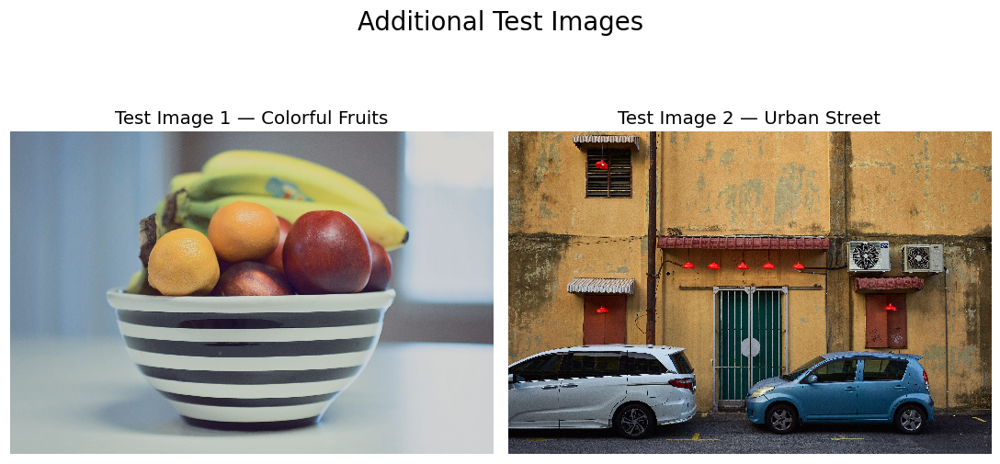


Processing Test Image 1
Test Image 1 — Colorful Fruits: initialization 1/3 (seed = 2642)
Test Image 1 — Colorful Fruits: initialization 2/3 (seed = 2643)
Test Image 1 — Colorful Fruits: initialization 3/3 (seed = 2644)
Test Image 1 — Colorful Fruits: segmentation completed.
  Resolution       : 800 × 534
  Total pixels     : 427,200
  Selected K       : 6
  Best run         : 3
  Converged        : True
  Iterations       : 19
  Inertia/pixel    : 0.010025
  Silhouette score : 0.5003
  PSNR             : 24.7580 dB
  SSIM             : 0.8686

Processing Test Image 2
Test Image 2 — Urban Street: initialization 1/3 (seed = 3642)
Test Image 2 — Urban Street: initialization 2/3 (seed = 3643)
Test Image 2 — Urban Street: initialization 3/3 (seed = 3644)
Test Image 2 — Urban Street: segmentation completed.
  Resolution       : 800 × 534
  Total pixels     : 427,200
  Selected K       : 6
  Best run         : 1
  Converged        : True
  Iterations       : 40
  Inertia/pixel    : 0.012879


In [ ]:
# ============================================================
# 23. Upload and Process Two Additional Test Images
# ============================================================

uploaded_test_files = files.upload()


# ------------------------------------------------------------
# Validate uploaded files
# ------------------------------------------------------------

if len(uploaded_test_files) != 2:
    raise ValueError(
        "Please upload exactly two test images: "
        "test_image_1.jpg and test_image_2.jpg."
    )


uploaded_test_names = sorted(
    uploaded_test_files.keys()
)


def identify_test_filename(
    uploaded_names,
    test_number
):
    """
    Find a filename containing test_image_1 or test_image_2.
    Fall back to alphabetical order when necessary.
    """

    expected_text = f"test_image_{test_number}"

    matching_names = [
        file_name
        for file_name in uploaded_names
        if expected_text in file_name.lower()
    ]

    if len(matching_names) == 1:
        return matching_names[0]

    return uploaded_names[test_number - 1]


test_image_1_name = identify_test_filename(
    uploaded_test_names,
    test_number=1
)

test_image_2_name = identify_test_filename(
    uploaded_test_names,
    test_number=2
)


if test_image_1_name == test_image_2_name:
    raise ValueError(
        "The two test images could not be identified "
        "correctly."
    )


# ------------------------------------------------------------
# Read and validate both images
# ------------------------------------------------------------

try:
    with Image.open(
        io.BytesIO(
            uploaded_test_files[test_image_1_name]
        )
    ) as opened_test_image_1:

        test_image_1 = (
            opened_test_image_1
            .convert("RGB")
            .copy()
        )

except Exception as error:
    raise ValueError(
        "Test image 1 is not a valid image."
    ) from error


try:
    with Image.open(
        io.BytesIO(
            uploaded_test_files[test_image_2_name]
        )
    ) as opened_test_image_2:

        test_image_2 = (
            opened_test_image_2
            .convert("RGB")
            .copy()
        )

except Exception as error:
    raise ValueError(
        "Test image 2 is not a valid image."
    ) from error


print("Additional test images loaded successfully.")
print("-" * 58)
print(
    f"Test image 1 : {test_image_1_name} | "
    f"Resolution: {test_image_1.size}"
)
print(
    f"Test image 2 : {test_image_2_name} | "
    f"Resolution: {test_image_2.size}"
)


# Display the two uploaded images before processing.
img_grid(
    [
        test_image_1,
        test_image_2
    ],
    title="Additional Test Images",
    individual_subtitle=[
        "Test Image 1 — Colorful Fruits",
        "Test Image 2 — Urban Street"
    ],
    col_wrap=2,
    height=5
)


# ------------------------------------------------------------
# Configure cluster numbers
# ------------------------------------------------------------

TEST_IMAGE_1_K = 6
TEST_IMAGE_2_K = 6


# ------------------------------------------------------------
# Segment test image 1
# ------------------------------------------------------------

print("\nProcessing Test Image 1")
print("=" * 58)

test_result_1 = segment_additional_image(
    input_image=test_image_1,
    image_name="Test Image 1 — Colorful Fruits",
    number_of_clusters=TEST_IMAGE_1_K,
    number_of_initializations=3,
    random_state=RANDOM_STATE + 2000,
    verbose=True
)


# ------------------------------------------------------------
# Segment test image 2
# ------------------------------------------------------------

print("\nProcessing Test Image 2")
print("=" * 58)

test_result_2 = segment_additional_image(
    input_image=test_image_2,
    image_name="Test Image 2 — Urban Street",
    number_of_clusters=TEST_IMAGE_2_K,
    number_of_initializations=3,
    random_state=RANDOM_STATE + 3000,
    verbose=True
)


# Keep both results together for later comparison.
additional_test_results = [
    test_result_1,
    test_result_2
]


print("\nBoth additional images were processed successfully.")

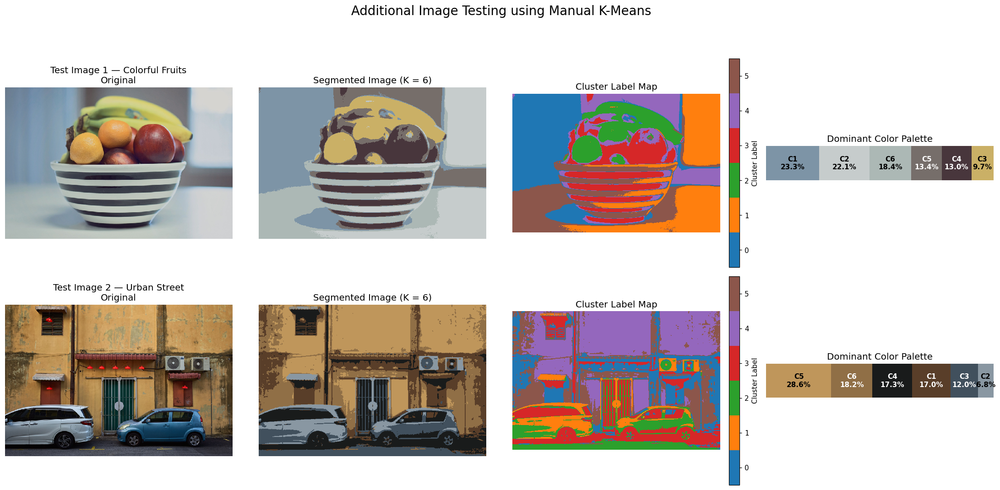

Additional image comparison dashboard generated successfully.


In [ ]:
# ============================================================
# 24. Visualize Additional Image Segmentation Results
# ============================================================

from matplotlib.colors import ListedColormap


def create_test_palette(
    segmentation_result,
    palette_width=800,
    palette_height=120
):
    """
    Create a proportional dominant-color palette from a
    segmentation-result dictionary.
    """

    cluster_percentages = (
        segmentation_result[
            "cluster_percentages"
        ]
    )

    centroid_colors = (
        segmentation_result[
            "centroid_colors_uint8"
        ]
    )

    dominance_order = (
        segmentation_result[
            "dominance_order"
        ]
    )

    palette_image = np.zeros(
        (
            palette_height,
            palette_width,
            3
        ),
        dtype=np.uint8
    )

    palette_segment_information = []

    current_position = 0
    cumulative_percentage = 0.0

    for order_index, cluster_index in enumerate(
        dominance_order
    ):

        percentage = (
            cluster_percentages[cluster_index]
        )

        cumulative_percentage += percentage

        if order_index == len(dominance_order) - 1:
            next_position = palette_width
        else:
            next_position = int(
                round(
                    cumulative_percentage
                    / 100
                    * palette_width
                )
            )

        palette_image[
            :,
            current_position:next_position
        ] = centroid_colors[cluster_index]

        palette_segment_information.append(
            {
                "cluster_index": cluster_index,
                "start": current_position,
                "end": next_position,
                "percentage": percentage
            }
        )

        current_position = next_position

    return (
        palette_image,
        palette_segment_information
    )


# Create palettes for both test images.
(
    test_palette_1,
    test_palette_segments_1
) = create_test_palette(test_result_1)

(
    test_palette_2,
    test_palette_segments_2
) = create_test_palette(test_result_2)


test_palettes = [
    test_palette_1,
    test_palette_2
]

test_palette_segments = [
    test_palette_segments_1,
    test_palette_segments_2
]


# ------------------------------------------------------------
# Create the comparison dashboard
# ------------------------------------------------------------

fig_additional, axes = plt.subplots(
    2,
    4,
    figsize=(20, 10)
)


for row_index, test_result in enumerate(
    additional_test_results
):

    current_k = test_result["k"]

    # Original resized image
    axes[row_index, 0].imshow(
        test_result["resized_image"]
    )

    axes[row_index, 0].set_title(
        f"{test_result['image_name']}\nOriginal"
    )

    axes[row_index, 0].axis("off")


    # Segmented image
    axes[row_index, 1].imshow(
        test_result["segmented_image_np"]
    )

    axes[row_index, 1].set_title(
        f"Segmented Image (K = {current_k})"
    )

    axes[row_index, 1].axis("off")


    # Cluster label map
    categorical_colors = (
        plt.get_cmap("tab10").colors[:current_k]
    )

    categorical_colormap = ListedColormap(
        categorical_colors
    )

    label_plot = axes[row_index, 2].imshow(
        test_result["label_map"],
        cmap=categorical_colormap,
        vmin=-0.5,
        vmax=current_k - 0.5
    )

    axes[row_index, 2].set_title(
        "Cluster Label Map"
    )

    axes[row_index, 2].axis("off")

    current_colorbar = fig_additional.colorbar(
        label_plot,
        ax=axes[row_index, 2],
        ticks=np.arange(current_k),
        fraction=0.046,
        pad=0.04
    )

    current_colorbar.set_label(
        "Cluster Label"
    )


    # Dominant-color palette
    current_palette = (
        test_palettes[row_index]
    )

    current_palette_segments = (
        test_palette_segments[row_index]
    )

    axes[row_index, 3].imshow(
        current_palette
    )

    axes[row_index, 3].set_title(
        "Dominant Color Palette"
    )

    axes[row_index, 3].axis("off")


    # Add text labels to palette segments.
    for segment in current_palette_segments:

        cluster_index = segment[
            "cluster_index"
        ]

        start_position = segment["start"]
        end_position = segment["end"]
        percentage = segment["percentage"]

        segment_center = (
            start_position + end_position
        ) / 2

        normalized_color = (
            test_result[
                "centroid_colors_uint8"
            ][cluster_index]
            / 255.0
        )

        red, green, blue = normalized_color

        perceived_brightness = (
            0.299 * red
            + 0.587 * green
            + 0.114 * blue
        )

        text_color = (
            "black"
            if perceived_brightness > 0.55
            else "white"
        )

        if percentage >= 5:
            axes[row_index, 3].text(
                segment_center,
                current_palette.shape[0] / 2,
                (
                    f"C{cluster_index + 1}\n"
                    f"{percentage:.1f}%"
                ),
                ha="center",
                va="center",
                color=text_color,
                fontsize=10,
                fontweight="bold"
            )


fig_additional.suptitle(
    "Additional Image Testing using Manual K-Means",
    fontsize=18,
    y=0.99
)

plt.tight_layout(
    rect=[0, 0, 1, 0.96]
)

plt.show()


print(
    "Additional image comparison dashboard "
    "generated successfully."
)

Comparison of all segmentation experiments
--------------------------------------------------------------


,Image,Experiment Type,K,Pixels,Iterations,Converged,Inertia per Pixel,Silhouette Score,PSNR (dB),SSIM,Runtime (seconds)
0,Primary Landscape,Complete Main Experiment,3,424000,14,True,0.012294,0.6924,23.8736,0.7555,1.7324
1,Colorful Fruits,Additional Test,6,427200,19,True,0.010025,0.5003,24.7580,0.8686,2.5140
2,Urban Street,Additional Test,6,427200,40,True,0.012879,0.4634,23.6705,0.7156,5.2381


Best result by individual metric
------------------------------------------
Lowest inertia per pixel : Colorful Fruits
Highest silhouette score : Primary Landscape
Highest PSNR             : Colorful Fruits
Highest SSIM             : Colorful Fruits


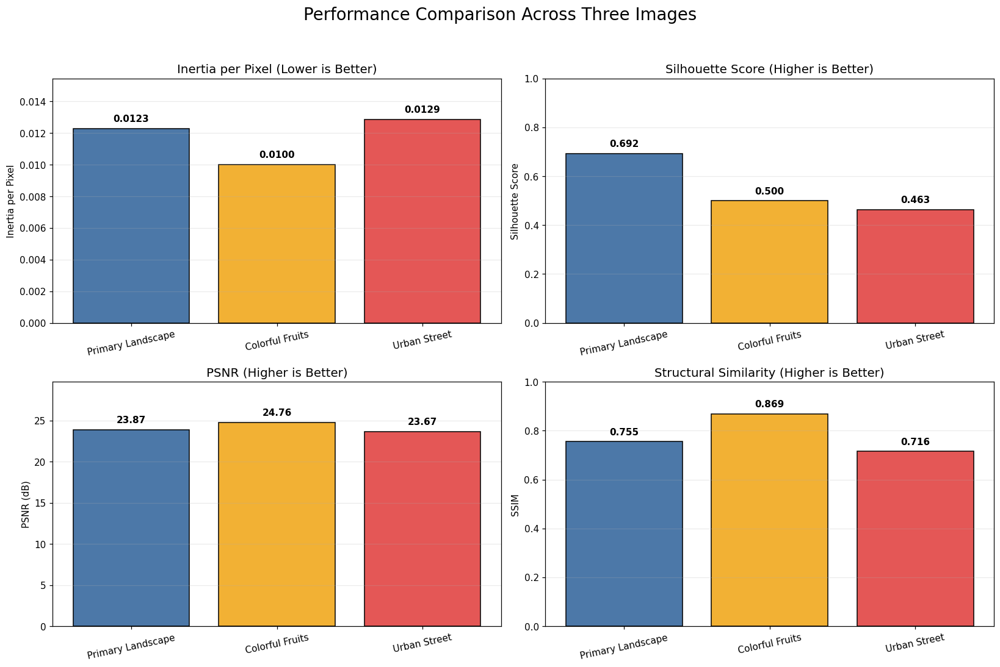

In [ ]:
# ============================================================
# 25. Compare Primary and Additional Experiment Results
# ============================================================

experiment_comparison_records = [
    {
        "Image": "Primary Landscape",
        "Experiment Type": "Complete Main Experiment",
        "K": FINAL_K,
        "Pixels": number_of_pixels,
        "Iterations": final_kmeans_result["iterations"],
        "Converged": final_kmeans_result["converged"],
        "Inertia per Pixel": final_inertia_per_pixel,
        "Silhouette Score": selected_silhouette_score,
        "PSNR (dB)": peak_signal_to_noise_ratio,
        "SSIM": structural_similarity_score,
        "Runtime (seconds)": (
            final_kmeans_result["runtime_seconds"]
        )
    },
    {
        "Image": "Colorful Fruits",
        "Experiment Type": "Additional Test",
        "K": test_result_1["k"],
        "Pixels": test_result_1["pixel_count"],
        "Iterations": (
            test_result_1[
                "kmeans_result"
            ]["iterations"]
        ),
        "Converged": (
            test_result_1[
                "kmeans_result"
            ]["converged"]
        ),
        "Inertia per Pixel": (
            test_result_1[
                "inertia_per_pixel"
            ]
        ),
        "Silhouette Score": (
            test_result_1[
                "silhouette_score"
            ]
        ),
        "PSNR (dB)": test_result_1["psnr"],
        "SSIM": test_result_1["ssim"],
        "Runtime (seconds)": (
            test_result_1[
                "kmeans_result"
            ]["runtime_seconds"]
        )
    },
    {
        "Image": "Urban Street",
        "Experiment Type": "Additional Test",
        "K": test_result_2["k"],
        "Pixels": test_result_2["pixel_count"],
        "Iterations": (
            test_result_2[
                "kmeans_result"
            ]["iterations"]
        ),
        "Converged": (
            test_result_2[
                "kmeans_result"
            ]["converged"]
        ),
        "Inertia per Pixel": (
            test_result_2[
                "inertia_per_pixel"
            ]
        ),
        "Silhouette Score": (
            test_result_2[
                "silhouette_score"
            ]
        ),
        "PSNR (dB)": test_result_2["psnr"],
        "SSIM": test_result_2["ssim"],
        "Runtime (seconds)": (
            test_result_2[
                "kmeans_result"
            ]["runtime_seconds"]
        )
    }
]


experiment_comparison_table = pd.DataFrame(
    experiment_comparison_records
)

experiment_comparison_display = (
    experiment_comparison_table.copy()
)

experiment_comparison_display[
    "Inertia per Pixel"
] = experiment_comparison_display[
    "Inertia per Pixel"
].round(6)

experiment_comparison_display[
    "Silhouette Score"
] = experiment_comparison_display[
    "Silhouette Score"
].round(4)

experiment_comparison_display[
    "PSNR (dB)"
] = experiment_comparison_display[
    "PSNR (dB)"
].round(4)

experiment_comparison_display[
    "SSIM"
] = experiment_comparison_display[
    "SSIM"
].round(4)

experiment_comparison_display[
    "Runtime (seconds)"
] = experiment_comparison_display[
    "Runtime (seconds)"
].round(4)


print("Comparison of all segmentation experiments")
print("-" * 62)
display(experiment_comparison_display)


# ------------------------------------------------------------
# Identify the strongest result under each metric
# ------------------------------------------------------------

lowest_inertia_image = (
    experiment_comparison_table.loc[
        experiment_comparison_table[
            "Inertia per Pixel"
        ].idxmin(),
        "Image"
    ]
)

highest_silhouette_image = (
    experiment_comparison_table.loc[
        experiment_comparison_table[
            "Silhouette Score"
        ].idxmax(),
        "Image"
    ]
)

highest_psnr_image = (
    experiment_comparison_table.loc[
        experiment_comparison_table[
            "PSNR (dB)"
        ].idxmax(),
        "Image"
    ]
)

highest_ssim_image = (
    experiment_comparison_table.loc[
        experiment_comparison_table[
            "SSIM"
        ].idxmax(),
        "Image"
    ]
)


print("Best result by individual metric")
print("-" * 42)
print(
    f"Lowest inertia per pixel : "
    f"{lowest_inertia_image}"
)
print(
    f"Highest silhouette score : "
    f"{highest_silhouette_image}"
)
print(
    f"Highest PSNR             : "
    f"{highest_psnr_image}"
)
print(
    f"Highest SSIM             : "
    f"{highest_ssim_image}"
)


# ------------------------------------------------------------
# Plot comparative performance
# ------------------------------------------------------------

comparison_image_names = (
    experiment_comparison_table["Image"]
)

comparison_colors = [
    "#4C78A8",
    "#F2B134",
    "#E45756"
]


fig_comparison, axes = plt.subplots(
    2,
    2,
    figsize=(15, 10)
)


metric_plot_information = [
    (
        "Inertia per Pixel",
        "Inertia per Pixel (Lower is Better)",
        "Inertia per Pixel",
        "{:.4f}"
    ),
    (
        "Silhouette Score",
        "Silhouette Score (Higher is Better)",
        "Silhouette Score",
        "{:.3f}"
    ),
    (
        "PSNR (dB)",
        "PSNR (Higher is Better)",
        "PSNR (dB)",
        "{:.2f}"
    ),
    (
        "SSIM",
        "Structural Similarity (Higher is Better)",
        "SSIM",
        "{:.3f}"
    )
]


for axis, metric_information in zip(
    axes.flatten(),
    metric_plot_information
):

    (
        metric_column,
        plot_title,
        y_axis_label,
        value_format
    ) = metric_information

    metric_values = (
        experiment_comparison_table[
            metric_column
        ]
    )

    bars = axis.bar(
        comparison_image_names,
        metric_values,
        color=comparison_colors,
        edgecolor="black"
    )

    axis.set_title(plot_title)
    axis.set_ylabel(y_axis_label)
    axis.grid(
        axis="y",
        alpha=0.25
    )

    axis.tick_params(
        axis="x",
        rotation=12
    )

    if metric_column in [
        "Silhouette Score",
        "SSIM"
    ]:
        axis.set_ylim(0, 1)

    else:
        axis.set_ylim(
            0,
            metric_values.max() * 1.2
        )

    for bar, value in zip(
        bars,
        metric_values
    ):
        axis.text(
            bar.get_x()
            + bar.get_width() / 2,
            bar.get_height()
            + axis.get_ylim()[1] * 0.02,
            value_format.format(value),
            ha="center",
            va="bottom",
            fontweight="bold"
        )


fig_comparison.suptitle(
    "Performance Comparison Across Three Images",
    fontsize=18,
    y=0.99
)

plt.tight_layout(
    rect=[0, 0, 1, 0.96]
)

plt.show()

In [ ]:
# ============================================================
# 26. Save and Download the Complete Project Results
# ============================================================

COMPLETE_PROJECT_DIRECTORY = (
    "kmeans_complete_project_results"
)

PRIMARY_OUTPUT_SUBDIRECTORY = os.path.join(
    COMPLETE_PROJECT_DIRECTORY,
    "primary_landscape"
)

TEST_1_OUTPUT_SUBDIRECTORY = os.path.join(
    COMPLETE_PROJECT_DIRECTORY,
    "test_1_colorful_fruits"
)

TEST_2_OUTPUT_SUBDIRECTORY = os.path.join(
    COMPLETE_PROJECT_DIRECTORY,
    "test_2_urban_street"
)

COMPARISON_OUTPUT_SUBDIRECTORY = os.path.join(
    COMPLETE_PROJECT_DIRECTORY,
    "experiment_comparison"
)


# Create output directories.
for directory_path in [
    COMPLETE_PROJECT_DIRECTORY,
    PRIMARY_OUTPUT_SUBDIRECTORY,
    TEST_1_OUTPUT_SUBDIRECTORY,
    TEST_2_OUTPUT_SUBDIRECTORY,
    COMPARISON_OUTPUT_SUBDIRECTORY
]:
    os.makedirs(
        directory_path,
        exist_ok=True
    )


# ------------------------------------------------------------
# Copy previously saved primary experiment results
# ------------------------------------------------------------

if os.path.exists(PRIMARY_RESULT_DIRECTORY):

    shutil.copytree(
        PRIMARY_RESULT_DIRECTORY,
        PRIMARY_OUTPUT_SUBDIRECTORY,
        dirs_exist_ok=True
    )


# ------------------------------------------------------------
# Function for saving an additional test result
# ------------------------------------------------------------

def save_additional_test_result(
    test_result,
    palette_image,
    output_directory
):
    """
    Save images, dominant colors, metrics, run history,
    and convergence history for an additional test image.
    """

    os.makedirs(
        output_directory,
        exist_ok=True
    )

    # Save main images.
    test_result["resized_image"].save(
        os.path.join(
            output_directory,
            "01_original_resized_image.png"
        )
    )

    test_result["processed_image"].save(
        os.path.join(
            output_directory,
            "02_preprocessed_image.png"
        )
    )

    test_result["segmented_image"].save(
        os.path.join(
            output_directory,
            "03_segmented_image.png"
        )
    )

    Image.fromarray(
        palette_image
    ).save(
        os.path.join(
            output_directory,
            "04_dominant_color_palette.png"
        )
    )

    # Create and save a colorized label map.
    current_k = test_result["k"]

    current_label_colors = np.asarray(
        plt.get_cmap("tab10").colors[
            :current_k
        ]
    )

    current_label_colors_uint8 = np.round(
        current_label_colors * 255
    ).astype(np.uint8)

    current_colorized_label_map = (
        current_label_colors_uint8[
            test_result["label_map"]
        ]
    )

    Image.fromarray(
        current_colorized_label_map
    ).save(
        os.path.join(
            output_directory,
            "05_colorized_cluster_label_map.png"
        )
    )

    # Create a dominant-color table.
    dominant_records = []

    for dominance_rank, cluster_index in enumerate(
        test_result["dominance_order"],
        start=1
    ):

        rgb_color = test_result[
            "centroid_colors_uint8"
        ][cluster_index]

        dominant_records.append(
            {
                "Dominance Rank": dominance_rank,
                "Cluster": (
                    f"Cluster {cluster_index + 1}"
                ),
                "Label": int(cluster_index),
                "RGB Color": (
                    f"({rgb_color[0]}, "
                    f"{rgb_color[1]}, "
                    f"{rgb_color[2]})"
                ),
                "Hex Color": rgb_to_hex(rgb_color),
                "Pixel Count": int(
                    test_result[
                        "cluster_counts"
                    ][cluster_index]
                ),
                "Percentage (%)": float(
                    test_result[
                        "cluster_percentages"
                    ][cluster_index]
                )
            }
        )

    current_dominant_table = pd.DataFrame(
        dominant_records
    )

    current_dominant_table.to_csv(
        os.path.join(
            output_directory,
            "dominant_color_analysis.csv"
        ),
        index=False
    )

    # Save initialization comparison.
    test_result["run_table"].to_csv(
        os.path.join(
            output_directory,
            "initialization_comparison.csv"
        ),
        index=False
    )

    # Save convergence history.
    current_kmeans_result = (
        test_result["kmeans_result"]
    )

    current_convergence_table = pd.DataFrame(
        {
            "Iteration": np.arange(
                1,
                len(
                    current_kmeans_result[
                        "inertia_history"
                    ]
                ) + 1
            ),
            "Inertia": current_kmeans_result[
                "inertia_history"
            ],
            "Inertia per Pixel": (
                current_kmeans_result[
                    "inertia_history"
                ]
                / test_result["pixel_count"]
            ),
            "Maximum Centroid Shift": (
                current_kmeans_result[
                    "centroid_shift_history"
                ]
            )
        }
    )

    current_convergence_table.to_csv(
        os.path.join(
            output_directory,
            "convergence_history.csv"
        ),
        index=False
    )

    # Save evaluation metrics.
    current_metrics_table = pd.DataFrame(
        [
            {
                "Image": test_result["image_name"],
                "K": test_result["k"],
                "Width": test_result["width"],
                "Height": test_result["height"],
                "Total Pixels": (
                    test_result["pixel_count"]
                ),
                "Iterations": (
                    current_kmeans_result[
                        "iterations"
                    ]
                ),
                "Converged": (
                    current_kmeans_result[
                        "converged"
                    ]
                ),
                "Inertia": (
                    current_kmeans_result[
                        "inertia"
                    ]
                ),
                "Inertia per Pixel": (
                    test_result[
                        "inertia_per_pixel"
                    ]
                ),
                "Silhouette Score": (
                    test_result[
                        "silhouette_score"
                    ]
                ),
                "MSE": test_result["mse"],
                "PSNR (dB)": test_result["psnr"],
                "SSIM": test_result["ssim"],
                "Selected Run Time (seconds)": (
                    current_kmeans_result[
                        "runtime_seconds"
                    ]
                ),
                "Total Multi-Run Time (seconds)": (
                    test_result[
                        "total_runtime_seconds"
                    ]
                )
            }
        ]
    )

    current_metrics_table.to_csv(
        os.path.join(
            output_directory,
            "evaluation_metrics.csv"
        ),
        index=False
    )


# Save both additional experiments.
save_additional_test_result(
    test_result=test_result_1,
    palette_image=test_palette_1,
    output_directory=TEST_1_OUTPUT_SUBDIRECTORY
)

save_additional_test_result(
    test_result=test_result_2,
    palette_image=test_palette_2,
    output_directory=TEST_2_OUTPUT_SUBDIRECTORY
)


# ------------------------------------------------------------
# Save cross-image comparison outputs
# ------------------------------------------------------------

experiment_comparison_table.to_csv(
    os.path.join(
        COMPARISON_OUTPUT_SUBDIRECTORY,
        "three_image_metric_comparison.csv"
    ),
    index=False
)

fig_additional.savefig(
    os.path.join(
        COMPARISON_OUTPUT_SUBDIRECTORY,
        "additional_image_dashboard.png"
    ),
    dpi=200,
    bbox_inches="tight"
)

fig_comparison.savefig(
    os.path.join(
        COMPARISON_OUTPUT_SUBDIRECTORY,
        "metric_comparison_graphs.png"
    ),
    dpi=200,
    bbox_inches="tight"
)


# Save image-source information.
image_source_table = pd.DataFrame(
    [
        {
            "Image": "Primary Landscape",
            "Source": (
                "User-selected image; include the "
                "original source URL in the report"
            )
        },
        {
            "Image": "Colorful Fruits",
            "Source": (
                "https://www.pexels.com/photo/"
                "sliced-mixed-fruits-in-a-white-"
                "ceramic-bowl-8805091/"
            )
        },
        {
            "Image": "Urban Street",
            "Source": (
                "https://www.pexels.com/photo/"
                "urban-city-street-with-colorful-"
                "buildings-34800961/"
            )
        }
    ]
)

image_source_table.to_csv(
    os.path.join(
        COMPLETE_PROJECT_DIRECTORY,
        "image_sources.csv"
    ),
    index=False
)


# ------------------------------------------------------------
# Create and download the final ZIP archive
# ------------------------------------------------------------

complete_zip_path = shutil.make_archive(
    COMPLETE_PROJECT_DIRECTORY,
    "zip",
    root_dir=COMPLETE_PROJECT_DIRECTORY
)

complete_zip_size_mb = (
    os.path.getsize(complete_zip_path)
    / (1024 ** 2)
)


print("Complete project results saved successfully.")
print("-" * 62)
print(
    f"Project directory : "
    f"{COMPLETE_PROJECT_DIRECTORY}"
)
print(
    f"Final ZIP file    : "
    f"{complete_zip_path}"
)
print(
    f"ZIP file size     : "
    f"{complete_zip_size_mb:.2f} MB"
)

print("\nIncluded experiment folders:")
print(" - primary_landscape")
print(" - test_1_colorful_fruits")
print(" - test_2_urban_street")
print(" - experiment_comparison")
print(" - image_sources.csv")


files.download(complete_zip_path)

Complete project results saved successfully.
--------------------------------------------------------------
Project directory : kmeans_complete_project_results
Final ZIP file    : /content/kmeans_complete_project_results.zip
ZIP file size     : 8.41 MB

Included experiment folders:
 - primary_landscape
 - test_1_colorful_fruits
 - test_2_urban_street
 - experiment_comparison
 - image_sources.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>